In [1]:
import pandas as pd
import numpy as np
import scipy as sp
from scipy import stats
from scipy.stats import genextreme
from scipy.stats import gumbel_r
import matplotlib.pyplot as plt
import glob
import os
import seaborn as sns
import xarray as xr
from datetime import datetime

C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\backends\cfgrib_.py:27: UserWarning: Failed to load cfgrib - most likely there is a problem accessing the ecCodes library. Try `import cfgrib` to get the full error message
  warnings.warn(


In [2]:
datdir = 'D:\\[4] SEMESTER 8\\Bismillah TA\\DATA CH TAHUNAN\\'

In [3]:
centroid_data = pd.read_excel(datdir + "centroid_under1k_revisi.xlsx")
centroid_data

,Centroid,geometry,tanggal,hari,bulan,tahun,date
0,1,POINT (100.49981049572239 -0.8650666211426935),24-7-2012,24,7,2012,2012-7-24
1,2,POINT (100.49413168718442 -0.8680840800275689),14-5-2015,14,5,2015,2015-5-14
2,3,POINT (100.27071241941778 -0.4574512281653418),24-7-2012,24,7,2012,2012-7-24
3,4,POINT (100.27071241941778 -0.4574512281653418),10-12-2018,10,12,2018,2018-12-10
4,5,POINT (100.18424377046533 -0.3120751452095314),9-1-2021,9,1,2021,2021-1-9
...,...,...,...,...,...,...,...
88,91,POINT (98.08347604465315 3.614368866728707),18-11-2020,18,11,2020,2020-11-18
89,92,POINT (98.03031174590635 3.6737872935545814),29-5-2016,29,5,2016,2016-5-29
90,93,POINT (100.46392124290186 0.0158685865110505),9-11-2020,9,11,2020,2020-11-9
91,94,POINT (100.61110773467394 0.0430482643908401),28-1-2011,28,1,2011,2011-1-28


### Data CH GPM

In [4]:
# Pisahkan Longitude dan Latitude
split = centroid_data["geometry"].str.split(" ", n = 2, expand=True)

# Rename kolom 
data_centroid = split.rename(columns = {1: "Longitude", 2: "Latitude"})

# Buang tanda ()
data_centroid['Longitude'] = data_centroid['Longitude'].str.replace("(", "").astype(float)
data_centroid['Latitude'] = data_centroid['Latitude'].str.replace(")","").astype(float)

data_centroid['tanggal'] = pd.to_datetime(centroid_data['tanggal'])

C:\Users\Nurul Nabila Fadiyah\AppData\Local\Temp\ipykernel_24172\1840537997.py:8: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  data_centroid['Longitude'] = data_centroid['Longitude'].str.replace("(", "").astype(float)
C:\Users\Nurul Nabila Fadiyah\AppData\Local\Temp\ipykernel_24172\1840537997.py:9: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  data_centroid['Latitude'] = data_centroid['Latitude'].str.replace(")","").astype(float)
C:\Users\Nurul Nabila Fadiyah\AppData\Local\Temp\ipykernel_24172\1840537997.py:11: UserWarning: Parsing '24-11-2020' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  data_centroid['tanggal'] = pd.t

In [5]:
data_centroid["Tanggal"] = centroid_data["tanggal"]
data = data_centroid.drop(0, axis=1)
data

,Longitude,Latitude,tanggal,Tanggal
0,100.499810,-0.865067,2012-07-24,24-7-2012
1,100.494132,-0.868084,2015-05-14,14-5-2015
2,100.270712,-0.457451,2012-07-24,24-7-2012
3,100.270712,-0.457451,2018-10-12,10-12-2018
4,100.184244,-0.312075,2021-09-01,9-1-2021
...,...,...,...,...
88,98.083476,3.614369,2020-11-18,18-11-2020
89,98.030312,3.673787,2016-05-29,29-5-2016
90,100.463921,0.015869,2020-09-11,9-11-2020
91,100.611108,0.043048,2011-01-28,28-1-2011


In [7]:
# save = data.to_excel(datdir + 'data_centroid_1k.xlsx', index=None)

In [6]:
titik_centroid = pd.read_excel(datdir + "data_centroid_1k_revisi.xlsx")
titik_centroid

,Longitude,Latitude,tanggal,Tanggal,Day,Month,Year,Date,Lokasi,Luas
0,100.499810,-0.865067,2012-07-24,24-7-2012,24,7,2012,2012-7-24,1,130.325204
1,100.494132,-0.868084,2015-05-14,14-5-2015,14,5,2015,2015-5-14,1,137.939508
2,100.270712,-0.457451,2012-07-24,24-7-2012,24,7,2012,2012-7-24,1,203.259681
3,100.270712,-0.457451,2018-10-12,10-12-2018,10,12,2018,2018-12-10,1,203.259681
4,100.184244,-0.312075,2021-09-01,9-1-2021,9,1,2021,2021-1-9,1,297.348634
...,...,...,...,...,...,...,...,...,...,...
88,98.083476,3.614369,2020-11-18,18-11-2020,18,11,2020,2020-11-18,1,149.727893
89,98.030312,3.673787,2016-05-29,29-5-2016,29,5,2016,2016-5-29,1,930.665319
90,100.463921,0.015869,2020-09-11,9-11-2020,9,11,2020,2020-11-9,1,267.451392
91,100.611108,0.043048,2011-01-28,28-1-2011,28,1,2011,2011-1-28,1,92.867611


In [9]:
tabeltahun = []

for tahun in range(2000,2022):
    ds = xr.open_dataarray("D:/[4] SEMESTER 8/Bismillah TA/DATA CH TAHUNAN/GPM Indo {}.nc".format(tahun), decode_times=False)

    ikoordinat = []
    for i in range(len(centroid)):
        ikoordinat.append(
            ds.sel(longitude=centroid.loc[i,'Longitude'], 
                  latitude=centroid.loc[i,'Latitude'], 
                  method='nearest'
                  ).to_pandas().rename('centroid_{}'.format(i))
        )
    ds.close()
    tabeltahun.append(pd.concat(ikoordinat, axis=1))

df_alltime_allstat = pd.concat(tabeltahun, axis=0)
df_alltime_allstat

C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\backends\plugins.py:65: RuntimeWarning: Engine 'cfgrib' loading failed:
Cannot find the ecCodes library
  warnings.warn(f"Engine {name!r} loading failed:\n{ex}", RuntimeWarning)
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
C:\Users\Nurul Nabila Fadiyah\ana

,centroid_0,centroid_1,centroid_2,centroid_3,centroid_4,centroid_5,centroid_6,centroid_7,centroid_8,centroid_9,...,centroid_85,centroid_86,centroid_87,centroid_88,centroid_89,centroid_90,centroid_91,centroid_92,centroid_93,centroid_94
time,,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
30,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
60,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.0,0.011431,0.011431,0.0,0.000000,0.0
90,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.0,0.018470,0.018470,0.0,0.000000,0.0
120,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.0,0.034673,0.034673,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
260490,0.032011,0.032011,0.009984,0.009984,0.0,0.852430,0.007737,0.007691,0.007691,0.00000,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
260520,0.032011,0.032011,0.000000,0.000000,0.0,0.852386,0.000000,0.007692,0.007692,0.00000,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
260550,0.032011,0.032011,0.000000,0.000000,0.0,0.461924,0.000000,0.004312,0.004312,0.00000,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0


In [10]:
df_alltime_allstat

,centroid_0,centroid_1,centroid_2,centroid_3,centroid_4,centroid_5,centroid_6,centroid_7,centroid_8,centroid_9,...,centroid_85,centroid_86,centroid_87,centroid_88,centroid_89,centroid_90,centroid_91,centroid_92,centroid_93,centroid_94
time,,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
30,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
60,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.0,0.011431,0.011431,0.0,0.000000,0.0
90,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.0,0.018470,0.018470,0.0,0.000000,0.0
120,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.0,0.034673,0.034673,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
260490,0.032011,0.032011,0.009984,0.009984,0.0,0.852430,0.007737,0.007691,0.007691,0.00000,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
260520,0.032011,0.032011,0.000000,0.000000,0.0,0.852386,0.000000,0.007692,0.007692,0.00000,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
260550,0.032011,0.032011,0.000000,0.000000,0.0,0.461924,0.000000,0.004312,0.004312,0.00000,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0


In [11]:
# savedulu = df_alltime_allstat.to_excel(datdir + 'ch_gpm_cek.xlsx', index=None)

In [7]:
bukadata = pd.read_excel(datdir + "ch_gpm_cek.xlsx")
bukadata

,centroid_0,centroid_1,centroid_2,centroid_3,centroid_4,centroid_5,centroid_6,centroid_7,centroid_8,centroid_9,...,centroid_83,centroid_84,centroid_85,centroid_86,centroid_87,centroid_88,centroid_89,centroid_90,centroid_91,centroid_92
0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
1,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
2,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.0,0.011431,0.011431,0.0,0.000000,0.0
3,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.0,0.018470,0.018470,0.0,0.000000,0.0
4,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.0,0.034673,0.034673,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
369595,0.032011,0.032011,0.009984,0.009984,0.0,0.852430,0.007737,0.007691,0.007691,0.00000,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
369596,0.032011,0.032011,0.000000,0.000000,0.0,0.852386,0.000000,0.007692,0.007692,0.00000,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
369597,0.032011,0.032011,0.000000,0.000000,0.0,0.461924,0.000000,0.004312,0.004312,0.00000,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
369598,0.017997,0.017997,0.000000,0.000000,0.0,0.305522,0.000000,0.003917,0.003917,0.11902,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0


In [8]:
ch_20th = xr.open_mfdataset(glob.glob("..\\GPM Indo*.nc"))
ch_20th

C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\backends\plugins.py:65: RuntimeWarning: Engine 'cfgrib' loading failed:
Cannot find the ecCodes library
  warnings.warn(f"Engine {name!r} loading failed:\n{ex}", RuntimeWarning)
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


<xarray.Dataset>
Dimensions:                        (time: 369600, longitude: 600, latitude: 301)
Coordinates:
  * time                           (time) object 2000-06-01 00:00:00 ... 2021...
  * longitude                      (longitude) float32 90.05 90.15 ... 149.9
  * latitude                       (latitude) float32 -15.05 -14.95 ... 14.95
Data variables:
    __xarray_dataarray_variable__  (time, longitude, latitude) float32 dask.array<chunksize=(10272, 600, 301), meta=np.ndarray>

In [9]:
import cftime
import datetime
def getunix(t):
  # Convert to a datetime object
  dt_date = datetime.datetime.strptime(str(t), '%Y-%m-%d %H:%M:%S')

  # Convert to Unix timestamp
  unix_timestamp = int(dt_date.timestamp())
  return unix_timestamp

In [10]:
time_gpm = ch_20th['time'].values
time_gpm

array([cftime.DatetimeJulian(2000, 6, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeJulian(2000, 6, 1, 0, 30, 0, 0, has_year_zero=False),
       cftime.DatetimeJulian(2000, 6, 1, 1, 0, 0, 0, has_year_zero=False),
       ...,
       cftime.DatetimeJulian(2021, 6, 30, 22, 30, 0, 0, has_year_zero=False),
       cftime.DatetimeJulian(2021, 6, 30, 23, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeJulian(2021, 6, 30, 23, 30, 0, 0, has_year_zero=False)],
      dtype=object)

In [11]:
unix_time_gpm = []
for i in time_gpm:
  unix_time_gpm.append(getunix(i))

In [12]:
#cek data apakah ada waktu yang keskip atau tidak
start_end = {}
for i in range(len(time_gpm)-1):
  distance = getunix(time_gpm[i+1]) - getunix(time_gpm[i])
  if distance != 1800:
    start_end[i] = i+1
start_end

{}

In [13]:
tdf = pd.DataFrame({'timestamp': unix_time_gpm})
bukadata['Tanggal'] = pd.to_datetime(tdf['timestamp'], unit='s')
bukadata.head(369600)

,centroid_0,centroid_1,centroid_2,centroid_3,centroid_4,centroid_5,centroid_6,centroid_7,centroid_8,centroid_9,...,centroid_84,centroid_85,centroid_86,centroid_87,centroid_88,centroid_89,centroid_90,centroid_91,centroid_92,Tanggal
0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2000-05-31 17:00:00
1,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2000-05-31 17:30:00
2,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.011431,0.011431,0.0,0.000000,0.0,2000-05-31 18:00:00
3,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.018470,0.018470,0.0,0.000000,0.0,2000-05-31 18:30:00
4,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.034673,0.034673,0.0,0.000000,0.0,2000-05-31 19:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
369595,0.032011,0.032011,0.009984,0.009984,0.0,0.852430,0.007737,0.007691,0.007691,0.00000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2021-06-30 14:30:00
369596,0.032011,0.032011,0.000000,0.000000,0.0,0.852386,0.000000,0.007692,0.007692,0.00000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2021-06-30 15:00:00
369597,0.032011,0.032011,0.000000,0.000000,0.0,0.461924,0.000000,0.004312,0.004312,0.00000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2021-06-30 15:30:00
369598,0.017997,0.017997,0.000000,0.000000,0.0,0.305522,0.000000,0.003917,0.003917,0.11902,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2021-06-30 16:00:00


In [14]:
# Menyimpan data annual maxima
# save = bukadata.to_csv(datdir + 'ch_centroid_gpm.csv', index=None)

In [15]:
ch_centroid_gpm = pd.read_csv(datdir + "ch_centroid_gpm.csv")
ch_centroid_gpm

,centroid_0,centroid_1,centroid_2,centroid_3,centroid_4,centroid_5,centroid_6,centroid_7,centroid_8,centroid_9,...,centroid_84,centroid_85,centroid_86,centroid_87,centroid_88,centroid_89,centroid_90,centroid_91,centroid_92,Tanggal
0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2000-05-31 17:00:00
1,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2000-05-31 17:30:00
2,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.011431,0.011431,0.0,0.000000,0.0,2000-05-31 18:00:00
3,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.018470,0.018470,0.0,0.000000,0.0,2000-05-31 18:30:00
4,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.034673,0.034673,0.0,0.000000,0.0,2000-05-31 19:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
369595,0.032011,0.032011,0.009984,0.009984,0.0,0.852430,0.007737,0.007691,0.007691,0.00000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2021-06-30 14:30:00
369596,0.032011,0.032011,0.000000,0.000000,0.0,0.852386,0.000000,0.007692,0.007692,0.00000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2021-06-30 15:00:00
369597,0.032011,0.032011,0.000000,0.000000,0.0,0.461924,0.000000,0.004312,0.004312,0.00000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2021-06-30 15:30:00
369598,0.017997,0.017997,0.000000,0.000000,0.0,0.305522,0.000000,0.003917,0.003917,0.11902,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2021-06-30 16:00:00


### CH GPM 2011-2021

In [30]:
tabeltahun = []

for tahun in range(2011,2022):
    ds = xr.open_dataarray("D:/[4] SEMESTER 8/Bismillah TA/DATA CH TAHUNAN/GPM Indo {}.nc".format(tahun), decode_times=False)

    ikoordinat = []
    for i in range(len(data)):
        ikoordinat.append(
            ds.sel(longitude=data.loc[i,'Longitude'], 
                  latitude=data.loc[i,'Latitude'], 
                  method='nearest'
                  ).to_pandas().rename('centroid_{}'.format(i))
        )
    ds.close()
    tabeltahun.append(pd.concat(ikoordinat, axis=1))

df_alltime_allstat = pd.concat(tabeltahun, axis=0)
df_alltime_allstat

C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future 

KeyboardInterrupt: 

In [22]:
savedulu = df_alltime_allstat.to_excel(datdir + 'ch_gpm_cek11.xlsx', index=None)

In [31]:
data11th = pd.read_excel(datdir + "ch_gpm_cek11.xlsx")
data11th

,centroid_0,centroid_1,centroid_2,centroid_3,centroid_4,centroid_5,centroid_6,centroid_7,centroid_8,centroid_9,...,centroid_83,centroid_84,centroid_85,centroid_86,centroid_87,centroid_88,centroid_89,centroid_90,centroid_91,centroid_92
0,0.248310,0.248310,0.000000,0.000000,0.0,0.205928,0.000000,0.001750,0.001750,0.00000,...,0.0,0.0,0.0,0.0,0.0,0.018630,0.018630,0.0,0.000000,0.0
1,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.0,0.013945,0.013945,0.0,0.000000,0.0
2,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
3,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
4,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184027,0.032011,0.032011,0.009984,0.009984,0.0,0.852430,0.007737,0.007691,0.007691,0.00000,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
184028,0.032011,0.032011,0.000000,0.000000,0.0,0.852386,0.000000,0.007692,0.007692,0.00000,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
184029,0.032011,0.032011,0.000000,0.000000,0.0,0.461924,0.000000,0.004312,0.004312,0.00000,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
184030,0.017997,0.017997,0.000000,0.000000,0.0,0.305522,0.000000,0.003917,0.003917,0.11902,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0


In [38]:
gpm_10th = xr.open_mfdataset(glob.glob("..\\..\\GPM 2011-2021\\GPM Indo*.nc"))
gpm_10th

<xarray.Dataset>
Dimensions:                        (time: 184032, longitude: 600, latitude: 301)
Coordinates:
  * time                           (time) object 2011-01-01 00:00:00 ... 2021...
  * longitude                      (longitude) float32 90.05 90.15 ... 149.9
  * latitude                       (latitude) float32 -15.05 -14.95 ... 14.95
Data variables:
    __xarray_dataarray_variable__  (time, longitude, latitude) float32 dask.array<chunksize=(17520, 600, 301), meta=np.ndarray>

In [39]:
import cftime
import datetime
def getunix(t):
  # Convert to a datetime object
  dt_date = datetime.datetime.strptime(str(t), '%Y-%m-%d %H:%M:%S')

  # Convert to Unix timestamp
  unix_timestamp = int(dt_date.timestamp())
  return unix_timestamp

In [40]:
time_gpm = gpm_10th['time'].values
time_gpm

array([cftime.DatetimeJulian(2011, 1, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeJulian(2011, 1, 1, 0, 30, 0, 0, has_year_zero=False),
       cftime.DatetimeJulian(2011, 1, 1, 1, 0, 0, 0, has_year_zero=False),
       ...,
       cftime.DatetimeJulian(2021, 6, 30, 22, 30, 0, 0, has_year_zero=False),
       cftime.DatetimeJulian(2021, 6, 30, 23, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeJulian(2021, 6, 30, 23, 30, 0, 0, has_year_zero=False)],
      dtype=object)

In [41]:
unix_time_gpm = []
for i in time_gpm:
  unix_time_gpm.append(getunix(i))

In [42]:
#cek data apakah ada waktu yang keskip atau tidak
start_end = {}
for i in range(len(time_gpm)-1):
  distance = getunix(time_gpm[i+1]) - getunix(time_gpm[i])
  if distance != 1800:
    start_end[i] = i+1
start_end

{}

In [43]:
tdf = pd.DataFrame({'timestamp': unix_time_gpm})
data11th['Tanggal'] = pd.to_datetime(tdf['timestamp'], unit='s')
data11th.head(369600)

,centroid_0,centroid_1,centroid_2,centroid_3,centroid_4,centroid_5,centroid_6,centroid_7,centroid_8,centroid_9,...,centroid_84,centroid_85,centroid_86,centroid_87,centroid_88,centroid_89,centroid_90,centroid_91,centroid_92,Tanggal
0,0.248310,0.248310,0.000000,0.000000,0.0,0.205928,0.000000,0.001750,0.001750,0.00000,...,0.0,0.0,0.0,0.0,0.018630,0.018630,0.0,0.000000,0.0,2010-12-31 17:00:00
1,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.013945,0.013945,0.0,0.000000,0.0,2010-12-31 17:30:00
2,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2010-12-31 18:00:00
3,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2010-12-31 18:30:00
4,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2010-12-31 19:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184027,0.032011,0.032011,0.009984,0.009984,0.0,0.852430,0.007737,0.007691,0.007691,0.00000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2021-06-30 14:30:00
184028,0.032011,0.032011,0.000000,0.000000,0.0,0.852386,0.000000,0.007692,0.007692,0.00000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2021-06-30 15:00:00
184029,0.032011,0.032011,0.000000,0.000000,0.0,0.461924,0.000000,0.004312,0.004312,0.00000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2021-06-30 15:30:00
184030,0.017997,0.017997,0.000000,0.000000,0.0,0.305522,0.000000,0.003917,0.003917,0.11902,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2021-06-30 16:00:00


In [44]:
# Menyimpan data annual maxima
save = data11th.to_csv(datdir + 'ch_gpm_11th.csv', index=None)

In [7]:
ls "D:\[4] SEMESTER 8\Bismillah TA\GPM 2011-2021\GPM*.nc"

 Volume in drive D is DATA
 Volume Serial Number is 1A3F-128C

 Directory of D:\[4] SEMESTER 8\Bismillah TA\GPM 2011-2021

24/03/2023  14:33     3.462.451.294 GPM Indo 2011.nc
24/03/2023  14:36     3.338.062.838 GPM Indo 2012.nc
24/03/2023  14:39     3.326.056.685 GPM Indo 2013.nc
24/03/2023  14:44     3.269.410.165 GPM Indo 2014.nc
24/03/2023  14:46     2.881.699.189 GPM Indo 2015.nc
24/03/2023  14:49     3.599.722.519 GPM Indo 2016.nc
24/03/2023  14:52     3.865.779.623 GPM Indo 2017.nc
24/03/2023  14:55     3.345.720.275 GPM Indo 2018.nc
24/03/2023  14:57     2.960.525.914 GPM Indo 2019.nc
24/03/2023  15:01     3.563.570.604 GPM Indo 2020.nc
24/03/2023  15:03     1.893.125.734 GPM Indo 2021.nc
              11 File(s) 35.506.124.840 bytes
               0 Dir(s)  58.102.353.920 bytes free


In [8]:
ostdir = 'D:\\[4] SEMESTER 8\\Bismillah TA\\GPM 2011-2021'

In [9]:
glob.glob("..\\..\\GPM 2011-2021\\GPM Indo*.nc")

['..\\..\\GPM 2011-2021\\GPM Indo 2011.nc',
 '..\\..\\GPM 2011-2021\\GPM Indo 2012.nc',
 '..\\..\\GPM 2011-2021\\GPM Indo 2013.nc',
 '..\\..\\GPM 2011-2021\\GPM Indo 2014.nc',
 '..\\..\\GPM 2011-2021\\GPM Indo 2015.nc',
 '..\\..\\GPM 2011-2021\\GPM Indo 2016.nc',
 '..\\..\\GPM 2011-2021\\GPM Indo 2017.nc',
 '..\\..\\GPM 2011-2021\\GPM Indo 2018.nc',
 '..\\..\\GPM 2011-2021\\GPM Indo 2019.nc',
 '..\\..\\GPM 2011-2021\\GPM Indo 2020.nc',
 '..\\..\\GPM 2011-2021\\GPM Indo 2021.nc']

In [10]:
ls "D:\[4] SEMESTER 8\Bismillah TA\DATA CH TAHUNAN\GPM*.nc"

 Volume in drive D is DATA
 Volume Serial Number is 1A3F-128C

 Directory of D:\[4] SEMESTER 8\Bismillah TA\DATA CH TAHUNAN

13/12/2021  21:32     1.960.736.096 GPM Indo 2000.nc
13/12/2021  22:29     3.411.003.440 GPM Indo 2001.nc
13/12/2021  23:19     2.742.325.678 GPM Indo 2002.nc
14/12/2021  00:12     3.047.544.999 GPM Indo 2003.nc
14/12/2021  01:03     2.879.771.440 GPM Indo 2004.nc
14/12/2021  01:57     3.086.805.109 GPM Indo 2005.nc
14/12/2021  02:49     2.916.379.933 GPM Indo 2006.nc
14/12/2021  03:43     3.162.183.816 GPM Indo 2007.nc
14/12/2021  11:04     3.362.555.574 GPM Indo 2008.nc
14/12/2021  12:00     3.147.396.803 GPM Indo 2009.nc
14/12/2021  12:56     3.511.054.340 GPM Indo 2010.nc
14/12/2021  14:14     3.462.451.294 GPM Indo 2011.nc
14/12/2021  15:20     3.338.062.838 GPM Indo 2012.nc
14/12/2021  17:15     3.326.056.685 GPM Indo 2013.nc
14/12/2021  22:02     3.269.410.165 GPM Indo 2014.nc
14/12/2021  23:23     2.881.699.189 GPM Indo 2015.nc
15/12/2021  00:38     3.599

In [11]:
data_ch = xr.open_mfdataset(glob.glob("..\\GPM Indo*.nc"))
data_ch

<xarray.Dataset>
Dimensions:                        (time: 369600, longitude: 600, latitude: 301)
Coordinates:
  * time                           (time) object 2000-06-01 00:00:00 ... 2021...
  * longitude                      (longitude) float32 90.05 90.15 ... 149.9
  * latitude                       (latitude) float32 -15.05 -14.95 ... 14.95
Data variables:
    __xarray_dataarray_variable__  (time, longitude, latitude) float32 dask.array<chunksize=(10272, 600, 301), meta=np.ndarray>

In [5]:
import cftime
import datetime
def getunix(t):
  # Convert to a datetime object
  dt_date = datetime.datetime.strptime(str(t), '%Y-%m-%d %H:%M:%S')

  # Convert to Unix timestamp
  unix_timestamp = int(dt_date.timestamp())
  return unix_timestamp

In [6]:
time_gpm = data_ch['time'].values

In [7]:
unix_time_gpm = []
for i in time_gpm:
  unix_time_gpm.append(getunix(i))

In [8]:
#cek data apakah ada waktu yang keskip atau tidak
start_end = {}
for i in range(len(time_gpm)-1):
  distance = getunix(time_gpm[i+1]) - getunix(time_gpm[i])
  if distance != 1800:
    start_end[i] = i+1
start_end

{}

In [15]:
tdf = pd.DataFrame({'timestamp': unix_time_gpm})
ch_centroid['Tanggal'] = pd.to_datetime(tdf['timestamp'], unit='s')
ch_centroid.head(369600)

,centroid_1,centroid_2,centroid_3,centroid_4,centroid_5,centroid_6,centroid_7,centroid_8,centroid_9,centroid_10,...,centroid_110,centroid_111,centroid_112,centroid_113,centroid_114,centroid_115,centroid_116,centroid_117,centroid_118,Tanggal
0,0.650000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.043871,2000-05-31 17:00:00
1,0.650000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.060000,2000-05-31 17:30:00
2,0.427040,0.090000,0.101786,0.092092,0.164796,0.067857,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.019509,2000-05-31 18:00:00
3,0.206885,0.048805,0.190341,0.102491,0.165938,0.043925,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2000-05-31 18:30:00
4,0.050468,0.094413,0.269751,0.310214,0.296726,0.128132,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2000-05-31 19:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
369595,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.000000,0.000000,0.610000,0.230000,0.030000,0.000000,0.000000,2021-06-30 14:30:00
369596,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.000000,0.000000,1.310000,0.060000,0.000000,0.000000,0.000000,2021-06-30 15:00:00
369597,0.000000,0.000000,0.000000,0.000000,0.000724,0.025346,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.000000,0.000000,1.200792,0.054998,0.000000,0.000000,0.000000,2021-06-30 15:30:00
369598,0.000000,0.000000,0.000000,0.000000,0.000684,0.023944,0.0,0.0,0.0,0.0,...,0.0,0.164038,0.046123,0.046123,0.839834,0.705840,0.280910,0.736189,0.149307,2021-06-30 16:00:00


In [49]:
save_ch = ch_centroid.to_csv(datdir + 'ch_20th.csv', index=None)

### Periode Ulang

In [16]:
ch_20th = pd.read_csv(datdir + 'ch_centroid_gpm.csv')
ch_20th

,centroid_0,centroid_1,centroid_2,centroid_3,centroid_4,centroid_5,centroid_6,centroid_7,centroid_8,centroid_9,...,centroid_84,centroid_85,centroid_86,centroid_87,centroid_88,centroid_89,centroid_90,centroid_91,centroid_92,Tanggal
0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2000-05-31 17:00:00
1,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2000-05-31 17:30:00
2,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.011431,0.011431,0.0,0.000000,0.0,2000-05-31 18:00:00
3,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.018470,0.018470,0.0,0.000000,0.0,2000-05-31 18:30:00
4,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.034673,0.034673,0.0,0.000000,0.0,2000-05-31 19:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
369595,0.032011,0.032011,0.009984,0.009984,0.0,0.852430,0.007737,0.007691,0.007691,0.00000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2021-06-30 14:30:00
369596,0.032011,0.032011,0.000000,0.000000,0.0,0.852386,0.000000,0.007692,0.007692,0.00000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2021-06-30 15:00:00
369597,0.032011,0.032011,0.000000,0.000000,0.0,0.461924,0.000000,0.004312,0.004312,0.00000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2021-06-30 15:30:00
369598,0.017997,0.017997,0.000000,0.000000,0.0,0.305522,0.000000,0.003917,0.003917,0.11902,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2021-06-30 16:00:00


In [17]:
ch_20th = ch_20th.reset_index()
ch_20th

,index,centroid_0,centroid_1,centroid_2,centroid_3,centroid_4,centroid_5,centroid_6,centroid_7,centroid_8,...,centroid_84,centroid_85,centroid_86,centroid_87,centroid_88,centroid_89,centroid_90,centroid_91,centroid_92,Tanggal
0,0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2000-05-31 17:00:00
1,1,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2000-05-31 17:30:00
2,2,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.011431,0.011431,0.0,0.000000,0.0,2000-05-31 18:00:00
3,3,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.018470,0.018470,0.0,0.000000,0.0,2000-05-31 18:30:00
4,4,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.034673,0.034673,0.0,0.000000,0.0,2000-05-31 19:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
369595,369595,0.032011,0.032011,0.009984,0.009984,0.0,0.852430,0.007737,0.007691,0.007691,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2021-06-30 14:30:00
369596,369596,0.032011,0.032011,0.000000,0.000000,0.0,0.852386,0.000000,0.007692,0.007692,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2021-06-30 15:00:00
369597,369597,0.032011,0.032011,0.000000,0.000000,0.0,0.461924,0.000000,0.004312,0.004312,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2021-06-30 15:30:00
369598,369598,0.017997,0.017997,0.000000,0.000000,0.0,0.305522,0.000000,0.003917,0.003917,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2021-06-30 16:00:00


In [18]:
ch_20th['Tanggal'] = pd.to_datetime(ch_20th['Tanggal'])
ch_20th = ch_20th.set_index('Tanggal')

In [19]:
ch_hour_20th = ch_20th.resample('H').sum()/2
ch_hour_20th

,index,centroid_0,centroid_1,centroid_2,centroid_3,centroid_4,centroid_5,centroid_6,centroid_7,centroid_8,...,centroid_83,centroid_84,centroid_85,centroid_86,centroid_87,centroid_88,centroid_89,centroid_90,centroid_91,centroid_92
Tanggal,,,,,,,,,,,,,,,,,,,,,
2000-05-31 17:00:00,0.5,0.000000,0.000000,0.000000,0.000000,0.0,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,...,0.0,0.00000,0.00000,0.0,0.0,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00
2000-05-31 18:00:00,2.5,0.000000,0.000000,0.000000,0.000000,0.0,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,...,0.0,0.00000,0.00000,0.0,0.0,0.014951,0.014951,0.000000e+00,0.000000e+00,0.000000e+00
2000-05-31 19:00:00,4.5,0.000000,0.000000,0.000000,0.000000,0.0,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,...,0.0,0.00000,0.00000,0.0,0.0,0.049489,0.049489,0.000000e+00,0.000000e+00,0.000000e+00
2000-05-31 20:00:00,6.5,0.000000,0.000000,0.000000,0.000000,0.0,5.340369e-07,0.000000,7.356936e-09,7.356936e-09,...,0.0,0.00000,0.00000,0.0,0.0,0.086708,0.086708,1.889086e-08,2.059432e-08,4.454252e-08
2000-05-31 21:00:00,8.5,0.000000,0.000000,0.000000,0.000000,0.0,7.453890e-03,0.000000,2.728548e-02,2.728548e-02,...,0.0,0.00076,0.00076,0.0,0.0,0.044698,0.044698,1.265554e-04,1.379674e-04,2.984034e-04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-06-30 12:00:00,369590.5,0.867625,0.867625,0.000893,0.000893,0.0,7.017541e-01,0.000692,2.215810e-02,2.215810e-02,...,0.0,0.00000,0.00000,0.0,0.0,0.000000,0.000000,9.705611e-03,0.000000e+00,0.000000e+00
2021-06-30 13:00:00,369592.5,0.321775,0.321775,0.003052,0.003052,0.0,4.841332e-01,0.002365,8.861597e-03,8.861597e-03,...,0.0,0.00000,0.00000,0.0,0.0,0.000000,0.000000,3.413718e-03,0.000000e+00,0.000000e+00
2021-06-30 14:00:00,369594.5,0.110739,0.110739,0.009128,0.009128,0.0,8.534158e-01,0.007073,8.580065e-03,8.580065e-03,...,0.0,0.00000,0.00000,0.0,0.0,0.000000,0.000000,9.800799e-04,0.000000e+00,0.000000e+00


In [20]:
ch_daily_21th = ch_20th.resample('D').sum()
ch_daily_21th

,index,centroid_0,centroid_1,centroid_2,centroid_3,centroid_4,centroid_5,centroid_6,centroid_7,centroid_8,...,centroid_83,centroid_84,centroid_85,centroid_86,centroid_87,centroid_88,centroid_89,centroid_90,centroid_91,centroid_92
Tanggal,,,,,,,,,,,,,,,,,,,,,
2000-05-31,91,0.000000,0.000000,0.000000,0.000000,0.000000,0.530951,8.155005,0.058690,0.058690,...,0.000000,0.111955,0.111955,0.000000,0.000000,0.458792,0.458792,0.097552,0.106348,0.230016
2000-06-01,1800,24.628614,24.628614,13.463860,13.463860,9.814989,42.885198,106.379558,16.725601,16.725601,...,32.675287,16.109102,16.109102,32.871389,26.950121,21.183459,21.183459,10.855677,10.741516,12.993298
2000-06-02,4104,1.735548,1.735548,16.616001,16.616001,15.511759,8.065154,19.915453,50.066151,50.066151,...,2.610669,2.825491,2.825491,2.638808,0.719481,1.546001,1.546001,3.665594,5.152387,2.589796
2000-06-03,6408,10.219136,10.219136,0.442329,0.442329,0.022444,12.411599,39.450804,27.821618,27.821618,...,17.381819,1.265927,1.265927,28.077206,8.131130,0.750480,0.750480,2.787917,5.162390,9.012947
2000-06-04,8712,38.198209,38.198209,8.659450,8.659450,7.696211,55.984459,33.305508,44.919593,44.919593,...,4.492265,0.151118,0.151118,3.833696,1.800067,0.052216,0.052216,18.190704,17.640212,18.841787
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-06-26,17731080,38.521098,38.521098,6.093542,6.093542,14.637413,36.688359,33.680688,41.747737,41.747737,...,0.510818,1.306571,1.306571,0.542340,0.044493,2.590022,2.590022,11.263847,8.950805,6.588676
2021-06-27,17733384,9.819802,9.819802,29.037765,29.037765,21.649944,23.207768,67.031550,29.794479,29.794479,...,55.811403,7.355675,7.355675,11.327230,17.526685,14.160340,14.160340,12.037334,7.588785,11.651741
2021-06-28,17735688,21.364317,21.364317,20.367048,20.367048,22.379254,11.185682,47.592846,48.261959,48.261959,...,59.163219,93.543227,93.543227,60.649605,50.830645,73.602079,73.602079,33.256387,21.204310,28.713942


In [21]:
#Annual maxima
# ch_hour_20th = ch_hour_20th.reset_index()
# ch_hour_20th['years'] = ch_hour_20th['Tanggal'].dt.year
# grouped_data = ch_hour_20th.groupby('years')
# annual_max = grouped_data.max()
# annual_max

In [22]:
#Annual maxima
ch_daily_21th = ch_daily_21th.reset_index()
ch_daily_21th['years'] = ch_daily_21th['Tanggal'].dt.year
grouped_daily = ch_daily_21th.groupby('years')
annual_max_daily = grouped_daily.max()
annual_max_daily

,Tanggal,index,centroid_0,centroid_1,centroid_2,centroid_3,centroid_4,centroid_5,centroid_6,centroid_7,...,centroid_83,centroid_84,centroid_85,centroid_86,centroid_87,centroid_88,centroid_89,centroid_90,centroid_91,centroid_92
years,,,,,,,,,,,,,,,,,,,,,
2000,2000-12-31,492552,184.449684,184.449684,186.085904,186.085904,123.417959,158.515582,422.914846,197.574142,...,336.140302,188.145492,188.145492,237.194469,174.730202,173.908969,173.908969,110.075685,125.202473,100.468228
2001,2001-12-31,1333512,471.455862,471.455862,320.788635,320.788635,315.694440,227.031969,484.985688,165.764433,...,308.746065,186.566288,186.566288,214.931597,249.175470,188.461950,188.461950,194.278563,185.376162,196.111937
2002,2002-12-31,2174472,216.567516,216.567516,186.238973,186.238973,222.215258,365.793120,235.776655,471.186434,...,139.037988,175.419742,175.419742,115.756886,200.161894,127.914025,127.914025,169.563401,207.724779,140.278701
2003,2003-12-31,3015432,275.502889,275.502889,219.086087,219.086087,228.350727,157.337459,158.300970,177.806072,...,202.477595,150.182111,150.182111,176.795048,161.426893,153.503985,153.503985,179.373459,210.622970,166.824343
2004,2004-12-31,3858696,139.509384,139.509384,480.424116,480.424116,258.752275,120.976285,134.263509,114.114097,...,121.481875,130.011161,130.011161,207.955633,326.188345,182.818507,182.818507,199.055488,241.536543,309.085620
2005,2005-12-31,4699656,566.714645,566.714645,355.365398,355.365398,344.994388,161.697998,364.338234,214.381704,...,210.045651,198.411653,198.411653,179.057359,204.061543,255.300995,255.300995,399.188151,379.366013,263.695553
2006,2006-12-31,5540616,192.448291,192.448291,351.147127,351.147127,273.899928,284.455867,315.609775,182.531550,...,190.505258,214.091395,214.091395,214.288137,280.008455,211.118301,211.118301,119.723026,223.884942,173.312586
2007,2007-12-31,6381576,411.097013,411.097013,208.279778,208.279778,345.307459,174.560062,143.540768,144.522444,...,226.885476,284.748329,284.748329,245.197619,241.550703,289.068164,289.068164,323.918050,196.981151,399.750207
2008,2008-12-31,7224840,271.802720,271.802720,276.402466,276.402466,651.460054,252.154837,200.732965,211.927929,...,276.845792,199.571219,199.571219,300.129753,409.502124,393.186820,393.186820,259.095113,239.682460,236.853854


In [23]:
# T = [2,5,10,20,25,50,100]

# all_pu_all_centroid = pd.DataFrame()

# for i in range(0,129):
    
#     all_pu_centroid = pd.DataFrame()
    
#     for j in T:

#         # membuat fungsi untuk menghitung nilai periode ulang i tahun menggunakan metode Gumbel
#         ch_fit_gb = stats.gumbel_r.fit(annual_max['centroid_{}'.format(i+1)])    
#         pu_centroid = pd.DataFrame(stats.gumbel_r.ppf([1-(1/j)], * ch_fit_gb))

#         all_pu_centroid = pd.concat([all_pu_centroid, pu_centroid])
    
#     #all_pu_all_centroid = pd.concat([ all_pu_all_centroid, all_pu_centroid],axis=1)
#     all_pu_all_centroid['centroid_{}'.format(i+1)] = all_pu_centroid

In [24]:
T = [2,5,10,20,25,50,100]

all_pu = pd.DataFrame()

for i in range(0,93):
    
    all_pu_centroid_daily = pd.DataFrame()
    
    for j in T:

        # membuat fungsi untuk menghitung nilai periode ulang i tahun menggunakan metode Gumbel
        ch_fit_gb_day = stats.gumbel_r.fit(annual_max_daily['centroid_{}'.format(i)])    
        pu_centroid_daily = pd.DataFrame(stats.gumbel_r.ppf([1-(1/j)], * ch_fit_gb_day))

        all_pu_centroid_daily = pd.concat([all_pu_centroid_daily, pu_centroid_daily])
    
    #all_pu_all_centroid = pd.concat([ all_pu_all_centroid, all_pu_centroid],axis=1)
    all_pu['centroid_{}'.format(i)] = all_pu_centroid_daily

In [25]:
all_pu

,centroid_0,centroid_1,centroid_2,centroid_3,centroid_4,centroid_5,centroid_6,centroid_7,centroid_8,centroid_9,...,centroid_83,centroid_84,centroid_85,centroid_86,centroid_87,centroid_88,centroid_89,centroid_90,centroid_91,centroid_92
0,233.621631,233.621631,228.427307,228.427307,226.748814,170.479476,187.364844,171.369110,171.369110,182.713898,...,179.679946,175.215085,175.215085,192.634624,205.961484,197.353966,197.353966,189.281169,187.557157,189.501886
0,313.521530,313.521530,298.608692,298.608692,307.729409,222.786179,249.822589,222.976623,222.976623,232.307242,...,228.923595,210.468797,210.468797,246.541438,260.553299,253.498904,253.498904,241.945868,233.824785,246.231938
0,366.422216,366.422216,345.074875,345.074875,361.345609,257.417768,291.175052,257.145286,257.145286,265.142351,...,261.527175,233.809823,233.809823,282.232440,296.697830,290.671739,290.671739,276.814481,264.457980,283.792170
0,417.165824,417.165824,389.646354,389.646354,412.775555,290.637220,330.841326,289.920689,289.920689,296.638576,...,292.801312,256.199094,256.199094,316.468105,331.368533,326.328814,326.328814,310.261292,293.842077,319.820845
0,433.262373,433.262373,403.785021,403.785021,429.089820,301.174873,343.423997,300.317484,300.317484,306.629598,...,302.721886,263.301270,263.301270,327.328114,342.366542,337.639714,337.639714,320.871066,303.163104,331.249621
0,482.848219,482.848219,447.339561,447.339561,479.346346,333.636393,382.185250,332.345086,332.345086,337.407208,...,333.282475,285.179710,285.179710,360.782662,376.246201,372.483241,372.483241,353.554757,331.876776,366.456270
0,532.067932,532.067932,490.572501,490.572501,529.231785,365.858222,420.660296,364.136201,364.136201,367.957561,...,363.617410,306.896604,306.896604,393.990186,409.875698,407.069489,407.069489,385.997118,360.378431,401.402958


In [26]:
#Hasil PU/2
pu_fix_daily = all_pu/2
pu_fix_daily

,centroid_0,centroid_1,centroid_2,centroid_3,centroid_4,centroid_5,centroid_6,centroid_7,centroid_8,centroid_9,...,centroid_83,centroid_84,centroid_85,centroid_86,centroid_87,centroid_88,centroid_89,centroid_90,centroid_91,centroid_92
0,116.810815,116.810815,114.213654,114.213654,113.374407,85.239738,93.682422,85.684555,85.684555,91.356949,...,89.839973,87.607542,87.607542,96.317312,102.980742,98.676983,98.676983,94.640585,93.778578,94.750943
0,156.760765,156.760765,149.304346,149.304346,153.864704,111.393090,124.911295,111.488311,111.488311,116.153621,...,114.461797,105.234399,105.234399,123.270719,130.276649,126.749452,126.749452,120.972934,116.912392,123.115969
0,183.211108,183.211108,172.537437,172.537437,180.672805,128.708884,145.587526,128.572643,128.572643,132.571175,...,130.763588,116.904911,116.904911,141.116220,148.348915,145.335869,145.335869,138.407240,132.228990,141.896085
0,208.582912,208.582912,194.823177,194.823177,206.387778,145.318610,165.420663,144.960345,144.960345,148.319288,...,146.400656,128.099547,128.099547,158.234052,165.684266,163.164407,163.164407,155.130646,146.921038,159.910423
0,216.631186,216.631186,201.892510,201.892510,214.544910,150.587436,171.711999,150.158742,150.158742,153.314799,...,151.360943,131.650635,131.650635,163.664057,171.183271,168.819857,168.819857,160.435533,151.581552,165.624811
0,241.424110,241.424110,223.669780,223.669780,239.673173,166.818196,191.092625,166.172543,166.172543,168.703604,...,166.641238,142.589855,142.589855,180.391331,188.123100,186.241620,186.241620,176.777379,165.938388,183.228135
0,266.033966,266.033966,245.286250,245.286250,264.615892,182.929111,210.330148,182.068101,182.068101,183.978781,...,181.808705,153.448302,153.448302,196.995093,204.937849,203.534744,203.534744,192.998559,180.189215,200.701479


In [27]:
# pu_fix = all_pu_all_centroid
# pu_fix

In [27]:
# Menyimpan data annual maxima
save_pu = pu_fix_daily.to_excel(datdir + 'PU_20th.xlsx', index=None)

In [29]:
# pu_20th = pd.read_excel(datdir + 'PU_20th.xlsx')
# pu_20th

,centroid_1,centroid_2,centroid_3,centroid_4,centroid_5,centroid_6,centroid_7,centroid_8,centroid_9,centroid_10,...,centroid_109,centroid_110,centroid_111,centroid_112,centroid_113,centroid_114,centroid_115,centroid_116,centroid_117,centroid_118
0,57.764313,54.673265,54.689950,54.300283,52.491320,50.875847,53.357929,51.849345,52.408563,53.881872,...,50.770813,45.004514,50.327347,47.000841,47.000841,52.744408,41.426813,41.897281,41.768232,37.742950
1,76.786489,70.369821,75.940182,76.148925,71.372725,73.261173,77.664999,70.304533,73.824105,75.690992,...,70.733474,62.910526,68.081169,61.569156,61.569156,72.762786,53.863682,59.101598,57.205153,54.013387
2,89.380824,80.762306,90.009685,90.614627,83.873858,88.082207,93.758395,82.523473,88.003056,90.130528,...,83.950493,74.765864,79.835744,71.214647,71.214647,86.016694,62.097971,70.492353,67.425739,64.785832
3,101.461613,90.731027,103.505490,104.490476,95.865244,102.298899,109.195567,94.244174,101.603847,103.981277,...,96.628574,86.137789,91.111015,80.466834,80.466834,98.730161,69.996499,81.418639,77.229569,75.119020
4,105.293800,93.893239,107.786539,108.892080,99.669072,106.808623,114.092443,97.962136,105.918200,108.374919,...,100.650231,89.745115,94.687681,83.401751,83.401751,102.763042,72.502018,84.884603,80.339475,78.396845
5,117.098955,103.634515,120.974424,122.451339,111.386865,120.700948,129.177402,109.415418,119.208676,121.909651,...,113.039051,100.857580,105.705696,92.442841,92.442841,115.186439,80.220333,95.561595,89.919623,88.494272
6,128.816942,113.303863,134.064933,135.910478,123.018135,134.490694,144.150975,120.784132,132.401018,135.344444,...,125.336393,111.887991,116.642356,101.417173,101.417173,127.518104,87.881658,106.159751,99.429032,98.517141


In [30]:
# pu_centroid = pd.read_excel(datdir + 'Periode_Ulang2.xlsx')
# pu_centroid

,centroid_1,centroid_2,centroid_3,centroid_4,centroid_5,centroid_6,centroid_7,centroid_8,centroid_9,centroid_10,...,centroid_109,centroid_110,centroid_111,centroid_112,centroid_113,centroid_114,centroid_115,centroid_116,centroid_117,centroid_118
0,57.764313,54.673265,54.689950,54.300283,52.491320,50.875847,53.357929,51.849345,52.408563,53.881872,...,50.770813,45.004514,50.327347,47.000841,47.000841,52.744408,41.426813,41.897281,41.768232,37.742950
1,76.786489,70.369821,75.940182,76.148925,71.372725,73.261173,77.664999,70.304533,73.824105,75.690992,...,70.733474,62.910526,68.081169,61.569156,61.569156,72.762786,53.863682,59.101598,57.205153,54.013387
2,89.380824,80.762306,90.009685,90.614627,83.873858,88.082207,93.758395,82.523473,88.003056,90.130528,...,83.950493,74.765864,79.835744,71.214647,71.214647,86.016694,62.097971,70.492353,67.425739,64.785832
3,101.461613,90.731027,103.505490,104.490476,95.865244,102.298899,109.195567,94.244174,101.603847,103.981277,...,96.628574,86.137789,91.111015,80.466834,80.466834,98.730161,69.996499,81.418639,77.229569,75.119020
4,105.293800,93.893239,107.786539,108.892080,99.669072,106.808623,114.092443,97.962136,105.918200,108.374919,...,100.650231,89.745115,94.687681,83.401751,83.401751,102.763042,72.502018,84.884603,80.339475,78.396845
5,117.098955,103.634515,120.974424,122.451339,111.386865,120.700948,129.177402,109.415418,119.208676,121.909651,...,113.039051,100.857580,105.705696,92.442841,92.442841,115.186439,80.220333,95.561595,89.919623,88.494272
6,128.816942,113.303863,134.064933,135.910478,123.018135,134.490694,144.150975,120.784132,132.401018,135.344444,...,125.336393,111.887991,116.642356,101.417173,101.417173,127.518104,87.881658,106.159751,99.429032,98.517141


### Data Curah Hujan Ekstrem

In [14]:
gpm_10th = xr.open_mfdataset(glob.glob("..\\..\\GPM 2011-2021\\GPM Indo*.nc"))
gpm_10th

OSError: no files to open

In [28]:
pu_20th = pd.read_excel(datdir + 'PU_20th.xlsx', sheet_name="Sheet2")
pu_20th

,Centroid,PU5
0,centroid_0,156.760765
1,centroid_1,156.760765
2,centroid_2,149.304346
3,centroid_3,149.304346
4,centroid_4,153.864704
...,...,...
88,centroid_88,126.749452
89,centroid_89,126.749452
90,centroid_90,120.972934
91,centroid_91,116.912392


In [29]:
ch_10th = pd.read_csv(datdir + 'ch_gpm_11th.csv')
ch_10th

,centroid_0,centroid_1,centroid_2,centroid_3,centroid_4,centroid_5,centroid_6,centroid_7,centroid_8,centroid_9,...,centroid_84,centroid_85,centroid_86,centroid_87,centroid_88,centroid_89,centroid_90,centroid_91,centroid_92,Tanggal
0,0.248310,0.248310,0.000000,0.000000,0.0,0.205928,0.000000,0.001750,0.001750,0.00000,...,0.0,0.0,0.0,0.0,0.018630,0.018630,0.0,0.000000,0.0,2010-12-31 17:00:00
1,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.013945,0.013945,0.0,0.000000,0.0,2010-12-31 17:30:00
2,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2010-12-31 18:00:00
3,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2010-12-31 18:30:00
4,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2010-12-31 19:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184027,0.032011,0.032011,0.009984,0.009984,0.0,0.852430,0.007737,0.007691,0.007691,0.00000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2021-06-30 14:30:00
184028,0.032011,0.032011,0.000000,0.000000,0.0,0.852386,0.000000,0.007692,0.007692,0.00000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2021-06-30 15:00:00
184029,0.032011,0.032011,0.000000,0.000000,0.0,0.461924,0.000000,0.004312,0.004312,0.00000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2021-06-30 15:30:00
184030,0.017997,0.017997,0.000000,0.000000,0.0,0.305522,0.000000,0.003917,0.003917,0.11902,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2021-06-30 16:00:00


In [30]:
# tdf = pd.DataFrame({'timestamp': unix_time_10th})
# ch_10th['Tanggal'] = pd.to_datetime(tdf['timestamp'], unit='s')
# ch_tanggal_10th = ch_10th.head(184032)
# ch_tanggal_10th

In [31]:
ch_10th['Tanggal'] = pd.to_datetime(ch_10th['Tanggal'])
ch_10th=ch_10th.set_index('Tanggal')
gpm_daily_10th = ch_10th.resample('D').sum()
gpm_daily_10th

,centroid_0,centroid_1,centroid_2,centroid_3,centroid_4,centroid_5,centroid_6,centroid_7,centroid_8,centroid_9,...,centroid_83,centroid_84,centroid_85,centroid_86,centroid_87,centroid_88,centroid_89,centroid_90,centroid_91,centroid_92
Tanggal,,,,,,,,,,,,,,,,,,,,,
2010-12-31,0.250703,0.250703,0.000000,0.000000,0.000000,0.219540,0.151862,0.440228,0.440228,0.012729,...,0.000000,0.043673,0.043673,0.000000,0.000000,0.095974,0.095974,0.122650,0.221665,0.027364
2011-01-01,0.565054,0.565054,1.221996,1.221996,3.263232,2.500342,0.162834,3.019043,3.019043,0.216707,...,23.587238,11.067173,11.067173,13.203042,33.080356,33.017195,33.017195,2.152597,5.478162,5.770918
2011-01-02,36.229421,36.229421,21.298927,21.298927,20.798111,5.683544,4.769360,5.384145,5.384145,5.080096,...,11.043371,1.423756,1.423756,17.333312,3.323727,2.216155,2.216155,3.835591,3.749520,2.638179
2011-01-03,17.348781,17.348781,19.435172,19.435172,7.229782,30.630520,16.836922,5.746244,5.746244,12.846843,...,111.939449,82.669592,82.669592,126.656349,42.410349,117.148464,117.148464,11.813529,3.392672,2.500143
2011-01-04,2.777985,2.777985,1.798100,1.798100,1.651366,2.573445,0.962969,6.664895,6.664895,2.513782,...,58.252224,9.361643,9.361643,25.746438,26.175094,17.930068,17.930068,2.431933,1.482998,0.319928
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-06-26,38.521098,38.521098,6.093542,6.093542,14.637413,36.688359,33.680688,41.747737,41.747737,41.665899,...,0.510818,1.306571,1.306571,0.542340,0.044493,2.590022,2.590022,11.263847,8.950805,6.588676
2021-06-27,9.819802,9.819802,29.037765,29.037765,21.649944,23.207768,67.031550,29.794479,29.794479,36.184505,...,55.811403,7.355675,7.355675,11.327230,17.526685,14.160340,14.160340,12.037334,7.588785,11.651741
2021-06-28,21.364317,21.364317,20.367048,20.367048,22.379254,11.185682,47.592846,48.261959,48.261959,27.057760,...,59.163219,93.543227,93.543227,60.649605,50.830645,73.602079,73.602079,33.256387,21.204310,28.713942


In [32]:
ch_daily = gpm_daily_10th.reset_index()
time_fix = ch_daily['Tanggal'].values
time_fix

array(['2010-12-31T00:00:00.000000000', '2011-01-01T00:00:00.000000000',
       '2011-01-02T00:00:00.000000000', ...,
       '2021-06-28T00:00:00.000000000', '2021-06-29T00:00:00.000000000',
       '2021-06-30T00:00:00.000000000'], dtype='datetime64[ns]')

In [33]:
time_p = ch_daily['Tanggal']

In [34]:
idx_up5tahun = {}
pu_5tahun = []
for i in range(0, 93):
    centroid = f'centroid_{i}'
    pu5_ci = pu_20th['PU5'][i]  # Access the column based on the centroid name
    ch5_ci = gpm_daily_10th[centroid].values
    idx_up5tahun[centroid] = time_p[np.where(ch5_ci > pu5_ci)[0]]
idx_up5tahun

{'centroid_0': 33     2011-02-02
 245    2011-09-02
 708    2012-12-08
 729    2012-12-29
 971    2013-08-28
 1067   2013-12-02
 1093   2013-12-28
 1099   2014-01-03
 1148   2014-02-21
 1174   2014-03-19
 1259   2014-06-12
 1907   2016-03-21
 1994   2016-06-16
 2184   2016-12-23
 2231   2017-02-08
 3296   2020-01-09
 3784   2021-05-11
 Name: Tanggal, dtype: datetime64[ns],
 'centroid_1': 33     2011-02-02
 245    2011-09-02
 708    2012-12-08
 729    2012-12-29
 971    2013-08-28
 1067   2013-12-02
 1093   2013-12-28
 1099   2014-01-03
 1148   2014-02-21
 1174   2014-03-19
 1259   2014-06-12
 1907   2016-03-21
 1994   2016-06-16
 2184   2016-12-23
 2231   2017-02-08
 3296   2020-01-09
 3784   2021-05-11
 Name: Tanggal, dtype: datetime64[ns],
 'centroid_2': 30     2011-01-30
 244    2011-09-01
 327    2011-11-23
 345    2011-12-11
 505    2012-05-19
 706    2012-12-06
 820    2013-03-30
 822    2013-04-01
 961    2013-08-18
 973    2013-08-30
 1093   2013-12-28
 1099   2014-01-03
 1156 

In [35]:
# idx_up5tahun = {}
# pu_5tahun = []
# for i in range(0,94):
#     centroid = f'centroid_{i}'
#     pu5_ci = pu_20th[centroid][i]
#     ch5_ci = gpm_daily_10th[centroid].values
#     idx_up5tahun[centroid] = time_p[np.where(ch5_ci>pu5_ci)[0]]

# idx_up5tahun

In [116]:
import pandas as pd

# Membuat DataFrame dari idx_up5tahun
df_idx_up5tahun = pd.DataFrame(list(idx_up5tahun.items()), columns=['Centroid', 'Up_5_Tahun'])

# Menampilkan DataFrame
print(df_idx_up5tahun)


       Centroid                                         Up_5_Tahun
0    centroid_0  33     2011-02-02
245    2011-09-02
708    201...
1    centroid_1  33     2011-02-02
245    2011-09-02
708    201...
2    centroid_2  30     2011-01-30
244    2011-09-01
327    201...
3    centroid_3  30     2011-01-30
244    2011-09-01
327    201...
4    centroid_4  259    2011-09-16
327    2011-11-23
424    201...
..          ...                                                ...
90  centroid_90  330    2011-11-26
357    2011-12-23
492    201...
91  centroid_91  330    2011-11-26
357    2011-12-23
492    201...
92  centroid_92  78     2011-03-19
105    2011-04-15
257    201...
93  centroid_93  105    2011-04-15
110    2011-04-20
248    201...
94  centroid_94  105    2011-04-15
264    2011-09-21
293    201...

[95 rows x 2 columns]


In [119]:
# Menghitung jumlah nilai tiap baris pada kolom "Up_5_Tahun"
df_jumlah_per_baris = pd.DataFrame(df_idx_up5tahun["Up_5_Tahun"].apply(lambda x: len(x)))

# Memberi nama kolom pada DataFrame hasil perhitungan
df_jumlah_per_baris.columns = ["Jumlah"]

# Menampilkan DataFrame hasil perhitungan
df_jumlah = pd.DataFrame(df_jumlah_per_baris)
# savedulu = df_jumlah.to_excel('D:\[4] SEMESTER 8\Bismillah TA\DATA CH TAHUNAN\Data\jumlah_baris_p.xlsx', index=None)

In [40]:
# idx_up2tahun = {}
# pu_2tahun = []
# for i in range(1,119):
#   centroid = f'centroid_{i}'
#   pu2_ci = pu_20th[centroid][0]
#   ch_ci = gpm_hour_10th[centroid].values
#   idx_up2tahun[centroid] = time_fix[np.where(ch_ci>pu2_ci)[0]]
  
# idx_up2tahun

{'centroid_1': array(['2011-01-08T16:00:00.000000000', '2011-01-08T17:00:00.000000000',
        '2011-01-08T18:00:00.000000000', '2011-01-08T19:00:00.000000000',
        '2012-03-08T15:00:00.000000000', '2012-05-17T13:00:00.000000000',
        '2012-05-25T13:00:00.000000000', '2012-06-02T20:00:00.000000000',
        '2012-06-02T21:00:00.000000000', '2012-06-02T22:00:00.000000000',
        '2012-06-02T23:00:00.000000000', '2012-06-03T00:00:00.000000000',
        '2012-06-03T01:00:00.000000000', '2012-06-03T02:00:00.000000000',
        '2012-12-16T01:00:00.000000000', '2012-12-16T02:00:00.000000000',
        '2013-08-23T22:00:00.000000000', '2013-08-30T13:00:00.000000000',
        '2013-09-07T01:00:00.000000000', '2013-12-02T05:00:00.000000000',
        '2013-12-02T06:00:00.000000000', '2013-12-02T07:00:00.000000000',
        '2013-12-02T08:00:00.000000000', '2013-12-02T09:00:00.000000000',
        '2013-12-29T09:00:00.000000000', '2014-01-20T08:00:00.000000000',
        '2014-02-09T13:0

In [45]:
arr_combined = []
for i in range (len(idx_up5tahun)):
    ch    = idx_up5tahun['centroid_{}'.format(i+1)]

    for j in range (len(ch)):
        if np.concatenate(ch[j:j+1]):
            arr_combined.append(ch[j:j+1].tolist())

ValueError: zero-dimensional arrays cannot be concatenated

In [110]:
# ch_tanggal['Tanggal'] = pd.to_datetime(ch_tanggal['Tanggal'])
# ch_tanggal = ch_tanggal.set_index('Tanggal')

In [162]:
#Jadikan data perjaman 
# gpm_hour = ch_tanggal.reset_index()
# gpm_hour = ch_tanggal.resample('H').sum()
# gpm_hour

,index,centroid_1,centroid_2,centroid_3,centroid_4,centroid_5,centroid_6,centroid_7,centroid_8,centroid_9,...,centroid_109,centroid_110,centroid_111,centroid_112,centroid_113,centroid_114,centroid_115,centroid_116,centroid_117,centroid_118
Tanggal,,,,,,,,,,,,,,,,,,,,,
2010-12-31 17:00:00,1,0.593807,0.618219,1.376050,2.301650,2.338683,0.543538,0.059056,0.139583,0.170808,...,0.386054,0.681873,3.639101,2.760238,2.760238,2.259313,1.566979,1.628633,0.403113,1.775669
2010-12-31 18:00:00,5,0.038689,0.286297,0.000000,0.000000,0.000000,0.000000,0.054524,0.082262,0.174229,...,2.141693,0.521959,5.052522,3.522668,3.522668,2.202001,0.651271,0.016282,0.000000,0.000000
2010-12-31 19:00:00,9,0.045254,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.016424,0.640530,...,8.222791,1.947217,3.384443,7.618964,7.618964,5.274223,0.228973,0.005724,0.000000,0.000000
2010-12-31 20:00:00,13,0.237689,0.034667,0.102430,0.006955,0.437412,0.535748,0.011308,0.658862,0.198000,...,8.366612,1.981106,1.804665,7.113952,7.113952,5.020290,0.000000,0.000000,0.000000,0.000000
2010-12-31 21:00:00,17,2.835385,0.984711,0.495549,0.172565,0.322815,3.748551,0.000000,0.000000,0.000000,...,3.601833,0.866384,0.785321,2.984818,2.984818,2.113409,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-06-30 12:00:00,368045,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.016523,0.049570,0.446131,...,0.059013,0.000000,0.000000,0.000000,0.000000,0.211752,0.079841,0.010414,0.000000,0.000000
2021-06-30 13:00:00,368049,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.006886,0.020658,0.185921,...,0.165240,0.000000,0.000000,0.000000,0.000000,0.588142,0.221759,0.028925,0.000000,0.000000
2021-06-30 14:00:00,368053,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.001831,0.005493,0.049433,...,0.308811,0.000000,0.000000,0.000000,0.000000,1.108086,0.417803,0.054496,0.000000,0.000000


In [187]:
# time_10th_fix = gpm_hour_10th.index
# time_10th_fix

DatetimeIndex(['2010-12-31 17:00:00', '2010-12-31 18:00:00',
               '2010-12-31 19:00:00', '2010-12-31 20:00:00',
               '2010-12-31 21:00:00', '2010-12-31 22:00:00',
               '2010-12-31 23:00:00', '2011-01-01 00:00:00',
               '2011-01-01 01:00:00', '2011-01-01 02:00:00',
               ...
               '2021-06-30 07:00:00', '2021-06-30 08:00:00',
               '2021-06-30 09:00:00', '2021-06-30 10:00:00',
               '2021-06-30 11:00:00', '2021-06-30 12:00:00',
               '2021-06-30 13:00:00', '2021-06-30 14:00:00',
               '2021-06-30 15:00:00', '2021-06-30 16:00:00'],
              dtype='datetime64[ns]', name='Tanggal', length=92016, freq='H')

In [210]:
# idx_up2tahun = {}
# idx_up2tahun2 = {}
# pu_2tahun = []

# for i in range(1,119):
#     centroid = f'centroid_{i}'
#     pu2_ci = pu_20th[centroid][0]
#     ch_ci = gpm_hour_10th[centroid].values
#     idx_up2tahun[centroid] = time_10th_fix[np.where(ch_ci>pu2_ci)[0]]

# for i in range(1,119):
#     centroid = f'centroid_{i}'
#     idx_up2tahun2[centroid]=[]
#     for j in range(len(idx_up2tahun[centroid])):
#         idx_up2tahun2[centroid].append(idx_up2tahun[centroid][j].isoformat())

# #idx_up2tahun2

In [ ]:
# idx_up2tahun['centroid_1'][1].isoformat()

'2011-01-08T17:00:00'

### Ambil Data Kondisi Atmosfer (Kejadian Ekstrem)

In [143]:
ls "D:\[4] SEMESTER 8\Bismillah TA\[7] Data Kondisi Atmosfer\relative_humidity.nc"

 Volume in drive D is DATA
 Volume Serial Number is 1A3F-128C

 Directory of D:\[4] SEMESTER 8\Bismillah TA\[7] Data Kondisi Atmosfer

27/03/2023  23:24       539.056.424 relative_humidity.nc
               1 File(s)    539.056.424 bytes
               0 Dir(s)  41.173.446.656 bytes free


In [36]:
cape_data            =xr.load_dataarray("D:\[4] SEMESTER 8\Bismillah TA\[7] Data Kondisi Atmosfer\cape_1121.nc")
cin_data             =xr.load_dataarray("D:\[4] SEMESTER 8\Bismillah TA\[7] Data Kondisi Atmosfer\cin_1121.nc")
kindex_data          =xr.load_dataarray("D:\[4] SEMESTER 8\Bismillah TA\[7] Data Kondisi Atmosfer\kindex_1121.nc")
specifichum_data     =xr.load_dataarray("D:\[4] SEMESTER 8\Bismillah TA\[7] Data Kondisi Atmosfer\specific_humidity1121.nc")

In [37]:
relativehum_data     =xr.load_dataarray("D:\\[4] SEMESTER 8\\Bismillah TA\\[7] Data Kondisi Atmosfer\\relative_humidity1121.nc")
twv_data             =xr.load_dataarray("D:\\[4] SEMESTER 8\\Bismillah TA\\[7] Data Kondisi Atmosfer\\totalwatervapour_1121.nc")

In [38]:
windspeed_data       =xr.load_dataarray("D:\[4] SEMESTER 8\Bismillah TA\[7] Data Kondisi Atmosfer\windspeed.nc")
lls_data            =xr.load_dataarray("D:\[4] SEMESTER 8\Bismillah TA\[7] Data Kondisi Atmosfer\LLS_Sumatra.nc")
dls_data             =xr.load_dataarray("D:\[4] SEMESTER 8\Bismillah TA\[7] Data Kondisi Atmosfer\DLS_Sumatra.nc")

In [39]:
data_centroid

,0,Longitude,Latitude,tanggal,Tanggal
0,POINT,100.499810,-0.865067,2012-07-24,24-7-2012
1,POINT,100.494132,-0.868084,2015-05-14,14-5-2015
2,POINT,100.270712,-0.457451,2012-07-24,24-7-2012
3,POINT,100.270712,-0.457451,2018-10-12,10-12-2018
4,POINT,100.184244,-0.312075,2021-09-01,9-1-2021
...,...,...,...,...,...
88,POINT,98.083476,3.614369,2020-11-18,18-11-2020
89,POINT,98.030312,3.673787,2016-05-29,29-5-2016
90,POINT,100.463921,0.015869,2020-09-11,9-11-2020
91,POINT,100.611108,0.043048,2011-01-28,28-1-2011


In [40]:
titik_centroid

,Longitude,Latitude,tanggal,Tanggal,Day,Month,Year,Date,Lokasi,Luas
0,100.499810,-0.865067,2012-07-24,24-7-2012,24,7,2012,2012-7-24,1,130.325204
1,100.494132,-0.868084,2015-05-14,14-5-2015,14,5,2015,2015-5-14,1,137.939508
2,100.270712,-0.457451,2012-07-24,24-7-2012,24,7,2012,2012-7-24,1,203.259681
3,100.270712,-0.457451,2018-10-12,10-12-2018,10,12,2018,2018-12-10,1,203.259681
4,100.184244,-0.312075,2021-09-01,9-1-2021,9,1,2021,2021-1-9,1,297.348634
...,...,...,...,...,...,...,...,...,...,...
88,98.083476,3.614369,2020-11-18,18-11-2020,18,11,2020,2020-11-18,1,149.727893
89,98.030312,3.673787,2016-05-29,29-5-2016,29,5,2016,2016-5-29,1,930.665319
90,100.463921,0.015869,2020-09-11,9-11-2020,9,11,2020,2020-11-9,1,267.451392
91,100.611108,0.043048,2011-01-28,28-1-2011,28,1,2011,2011-1-28,1,92.867611


In [ ]:
# Si tanggal-tanggalnya   : idx_up5tahun
# Si koordinatnya         : centroid_data.assign(centroid=["centroid_%d" %i for i in range(1,119)])
# Si data yang mau dicari : cape_data, cin_data, kindex_data, specifichum_data
# centroid_x

### Ini namanya sel_data ###
cape_centroid = {}
cin_centroid = {}
kindex_centroid = {}
specifichum_centroid = {}
relativehum_centroid = {}
twv_centroid = {}
windspeed_centroid = {}
lls_centroid = {}
dls_centroid = {}
############################

### Ini loopingnya ###

# 1. Looping datanya
for ds_data, sel_data in zip([cape_data, cin_data, kindex_data, specifichum_data, relativehum_data, twv_data, windspeed_data, lls_data, dls_data], 
                             [cape_centroid, cin_centroid, kindex_centroid, specifichum_centroid, relativehum_centroid, twv_centroid, windspeed_centroid, lls_centroid, dls_centroid]):
    
    # 2. Looping centroidnya
    for x in range(len(titik_centroid)):
        
        # 3. Looping tanggal milik setiap centroidnya.      
        di_centroid_x = []
        for time_x in idx_up5tahun['centroid_%d' %x]:
            di_centroid_x.append(float(
                ds_data.sel(time      = time_x,
                            latitude  = titik_centroid.loc[x, 'Latitude'],
                            longitude = titik_centroid.loc[x, 'Longitude'],
                            method    = 'nearest'
                            ).values
            ))
        sel_data['centroid_%d' %x] = di_centroid_x

C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a futur

In [ ]:
#[item for sublist in l for item in sublist] 
cape_semuacentroid        = np.array([angka for titik_centroid in cape_centroid.values()        for angka in titik_centroid])
cin_semuacentroid         = np.array([angka for titik_centroid in cin_centroid.values()         for angka in titik_centroid])
kindex_semuacentroid      = np.array([angka for titik_centroid in kindex_centroid.values()      for angka in titik_centroid])
specifichum_semuacentroid = np.array([angka for titik_centroid in specifichum_centroid.values() for angka in titik_centroid])
relativehum_semuacentroid = np.array([angka for titik_centroid in relativehum_centroid.values() for angka in titik_centroid]) 
twv_semuacentroid         = np.array([angka for titik_centroid in twv_centroid.values() for angka in titik_centroid])
windspeed_semuacentroid   = np.array([angka for titik_centroid in windspeed_centroid.values() for angka in titik_centroid])
lls_semuacentroid        = np.array([angka for titik_centroid in lls_centroid.values() for angka in titik_centroid])
dls_semuacentroid         = np.array([angka for titik_centroid in dls_centroid.values() for angka in titik_centroid])

Text(0, 0.5, 'DLS (m/s)')

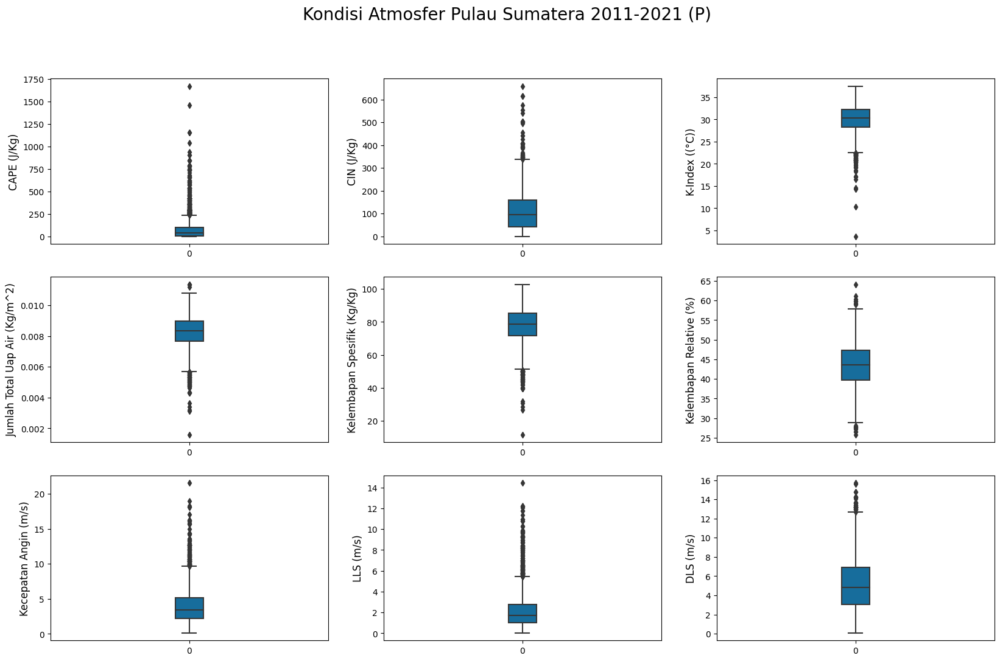

In [40]:
#######################
fig, axes = plt.subplots(3, 3, figsize=(20, 12))
 
fig.suptitle('Kondisi Atmosfer Pulau Sumatera 2011-2021 (P)', fontsize=20)
 
plt_cape_extrem          = sns.boxplot(ax=axes[0, 0], data=cape_semuacentroid, width=0.1, palette="colorblind")
plt_cin_extrem           = sns.boxplot(ax=axes[0, 1], data=cin_semuacentroid,  width=0.1, palette="colorblind")
plt_kindex_extrem        = sns.boxplot(ax=axes[0, 2], data=kindex_semuacentroid,  width=0.1, palette="colorblind")
plt_twv_extrem           = sns.boxplot(ax=axes[1, 0], data=specifichum_semuacentroid, width=0.1, palette="colorblind")
plt_specifichum_extrem   = sns.boxplot(ax=axes[1, 1], data=relativehum_semuacentroid, width=0.1, palette="colorblind")
plt_relativehum_extrem   = sns.boxplot(ax=axes[1, 2], data=twv_semuacentroid, width=0.1, palette="colorblind")
plt_windspeed_extrem     = sns.boxplot(ax=axes[2, 0], data=windspeed_semuacentroid, width=0.1, palette="colorblind")
plt_LLS_extrem          = sns.boxplot(ax=axes[2, 1], data=lls_semuacentroid, width=0.1, palette="colorblind")
plt_DLS_extrem           = sns.boxplot(ax=axes[2, 2], data=dls_semuacentroid, width=0.1, palette="colorblind")

plt_cape_extrem.set_ylabel("CAPE (J/Kg)", fontsize=12)
plt_cin_extrem.set_ylabel("CIN (J/Kg)", fontsize=12)
plt_kindex_extrem.set_ylabel("K-Index ((°C))", fontsize=12)
plt_twv_extrem.set_ylabel("Jumlah Total Uap Air (Kg/m^2)", fontsize=12)
plt_specifichum_extrem.set_ylabel("Kelembapan Spesifik (Kg/Kg)", fontsize=12)
plt_relativehum_extrem.set_ylabel("Kelembapan Relative (%)", fontsize=12)
plt_windspeed_extrem.set_ylabel("Kecepatan Angin (m/s)", fontsize=12)
plt_LLS_extrem.set_ylabel("LLS (m/s)", fontsize=12)
plt_DLS_extrem.set_ylabel("DLS (m/s)", fontsize=12)

In [118]:
# time_in_netcdf = cape_data.time.values
# time_in_netcdf

array(['2011-01-01T00:00:00.000000000', '2011-01-01T01:00:00.000000000',
       '2011-01-01T02:00:00.000000000', ...,
       '2021-12-31T21:00:00.000000000', '2021-12-31T22:00:00.000000000',
       '2021-12-31T23:00:00.000000000'], dtype='datetime64[ns]')

In [49]:
# array_2tahun = np.array(list(idx_up2tahun.values()))

# array_2tahun

C:\Users\Nurul Nabila Fadiyah\AppData\Local\Temp\ipykernel_9748\1172622490.py:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  array_2tahun = np.array(list(idx_up2tahun.values()))


array([array(['2011-01-08T16:00:00.000000000', '2011-01-08T17:00:00.000000000',
              '2011-01-08T18:00:00.000000000', '2011-01-08T19:00:00.000000000',
              '2012-03-08T15:00:00.000000000', '2012-05-17T13:00:00.000000000',
              '2012-05-25T13:00:00.000000000', '2012-06-02T20:00:00.000000000',
              '2012-06-02T21:00:00.000000000', '2012-06-02T22:00:00.000000000',
              '2012-06-02T23:00:00.000000000', '2012-06-03T00:00:00.000000000',
              '2012-06-03T01:00:00.000000000', '2012-06-03T02:00:00.000000000',
              '2012-12-16T01:00:00.000000000', '2012-12-16T02:00:00.000000000',
              '2013-08-23T22:00:00.000000000', '2013-08-30T13:00:00.000000000',
              '2013-09-07T01:00:00.000000000', '2013-12-02T05:00:00.000000000',
              '2013-12-02T06:00:00.000000000', '2013-12-02T07:00:00.000000000',
              '2013-12-02T08:00:00.000000000', '2013-12-02T09:00:00.000000000',
              '2013-12-29T09:00:00.00000

In [52]:
# time = {}
# for i in range (len(array_2tahun)):
#     time[i] = np.intersect1d(array_2tahun[i], time_in_netcdf)

In [56]:
# mengambil data netCDF berdasarkan waktu yang sama dengan data pada list array
# cape_extreme = {}
# for i in range (len(time)):
#     cape_extreme[i] = cape_data.sel(time=time[i])

In [65]:
# cape_ekstrim = {}
# for i in range (len(time)): 
#     cape_ekstrim[i] = cape_data.sel(time=time[i], latitude=centroid_data['Latitude'][i], longitude=centroid_data['Longitude'][i], method='nearest')

C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future 

### Data All

In [112]:
cape_data

<xarray.DataArray 'cape' (time: 96432, latitude: 49, longitude: 57)>
array([[[ 527.8086  ,  477.8672  ,  447.51172 , ...,  312.37695 ,
          334.9004  ,  331.9629  ],
        [ 655.1094  ,  411.2793  ,  279.08398 , ...,  359.38086 ,
          424.99023 ,  435.76172 ],
        [ 493.53516 ,  251.66406 ,   63.652344, ...,  292.79297 ,
          364.27734 ,  428.90625 ],
        ...,
        [ 375.04883 ,  512.1406  ,  560.12305 , ..., 1405.2031  ,
         1541.3164  , 1560.9023  ],
        [ 334.9004  ,  454.3672  ,  510.1836  , ...,  986.0918  ,
         1354.2832  , 1540.3379  ],
        [ 342.73438 ,  433.80273 ,  484.72266 , ...,  828.4336  ,
         1111.4336  , 1292.5918  ]],

       [[ 407.36328 ,  468.07617 ,  464.1582  , ...,  249.70703 ,
          248.72656 ,  276.14648 ],
        [ 447.51172 ,  397.5703  ,  309.43945 , ...,  340.7754  ,
          364.27734 ,  359.38086 ],
        [ 422.05078 ,  307.48047 ,  125.34375 , ...,  315.31445 ,
          376.02734 ,  352.5254  ],
...
        [ 417.15625 ,  453.38672 ,  428.90625 , ...,  518.9961  ,
          518.0176  ,  518.9961  ],
        [ 345.67188 ,  355.4629  ,  298.66797 , ...,  486.68164 ,
          517.0371  ,  575.791   ],
        [ 295.73047 ,  278.10352 ,  208.57812 , ...,  287.89648 ,
          393.6543  ,  516.0586  ]],

       [[ 308.46094 ,  435.76172 ,  487.66016 , ...,  154.7207  ,
          227.1836  ,  279.08398 ],
        [ 235.01758 ,  251.66406 ,  278.10352 , ...,  192.91016 ,
          238.93555 ,  275.16602 ],
        [ 208.57812 ,  151.7832  ,  134.15625 , ...,  239.91406 ,
          261.45703 ,  277.125   ],
        ...,
        [ 502.3496  ,  571.875   ,  568.9375  , ...,  566.      ,
          607.12695 ,  646.2969  ],
        [ 463.1797  ,  491.57812 ,  439.67773 , ...,  593.41797 ,
          660.9844  ,  713.8633  ],
        [ 431.84375 ,  423.03125 ,  340.7754  , ...,  413.23828 ,
          556.20703 ,  649.2344  ]]], dtype=float32)
Coordinates:
  * longitude  (longitude) float32 95.0 95.25 95.5 95.75 ... 108.5 108.8 109.0
  * latitude   (latitude) float32 5.9 5.65 5.4 5.15 ... -5.35 -5.6 -5.85 -6.1
  * time       (time) datetime64[ns] 2011-01-01 ... 2021-12-31T23:00:00
Attributes:
    units:      J kg**-1
    long_name:  Convective available potential energy

In [ ]:
print('Gabung Data CAPE')
centroid_lat = titik_centroid['Latitude'].values
centroid_lon = titik_centroid['Longitude'].values

cape_lat = cape_data['latitude'].values
cape_lon = cape_data['longitude'].values

def find_idx(base,goal):
    idx = []
    for i in goal:
        idx.append(np.argmin(abs(base-i)))
    return idx

#mencari index lat lon centroid di data cape
idx_lat = find_idx(cape_lat,centroid_lat)
idx_lon = find_idx(cape_lon,centroid_lon)

gabung_cape = np.array([]) #data gabungan 
for n in range(len(idx_lat)):
  gabung_cape = np.append(gabung_cape,cape_data[:,idx_lat[n],idx_lon[n]])
gabung_cape
  

In [42]:
# Convert the array to a DataFrame
df_gabung_cape = pd.DataFrame(gabung_cape, columns=['CAPE'])

# Display the DataFrame
print(df_gabung_cape)

               CAPE
0         51.900391
1         75.402344
2         53.859375
3         28.398438
4          9.792969
...             ...
8968171  102.820312
8968172   86.173828
8968173   71.486328
8968174   37.212891
8968175   24.482422

[8968176 rows x 1 columns]


In [ ]:
print('Gabung Data CAPE')
centroid_lat = titik_centroid['Latitude'].values
centroid_lon = titik_centroid['Longitude'].values
centroid_luas = titik_centroid['Luas'].values

cape_lat = cape_data['latitude'].values
cape_lon = cape_data['longitude'].values

def find_idx(base, goal):
    idx = []
    for i in goal:
        idx.append(np.argmin(abs(base-i)))
    return idx

# Mencari index lat lon centroid di data cape
idx_lat = find_idx(cape_lat, centroid_lat)
idx_lon = find_idx(cape_lon, centroid_lon)

gabung_cape = np.array([])  # Data gabungan
luas_counter = 0  # Counter for Luas values

for n in range(len(idx_lat)):
    gabung_cape = np.append(gabung_cape, cape_data[:, idx_lat[n], idx_lon[n]])

    # Check if 96432 records have been added, then update Luas value
    if (n+1) % 96432 == 0:
        luas_counter += 1

# Create a Luas column with repeated values based on the luas_counter
luas_values = np.repeat(centroid_luas, 96432)
df_gabung_cape = pd.DataFrame({'CAPE': gabung_cape, 'Luas': luas_values})

# Add a Kategori column with "All" values
df_gabung_cape['Kategori'] = 'All'

# Display the updated DataFrame
print(df_gabung_cape)

In [45]:
print('Gabung Data CIN')
centroid_lat = titik_centroid['Latitude'].values
centroid_lon = titik_centroid['Longitude'].values

cin_lat = cin_data['latitude'].values
cin_lon = cin_data['longitude'].values

def find_idx(base,goal):
    idx = []
    for i in goal:
        idx.append(np.argmin(abs(base-i)))
    return idx

#mencari index lat lon centroid di data cape
idx_lat = find_idx(cin_lat,centroid_lat)
idx_lon = find_idx(cin_lon,centroid_lon)

gabung_cin = np.array([]) #data gabungan 
for n in range(len(idx_lat)):
  gabung_cin = np.append(gabung_cin,cin_data[:,idx_lat[n],idx_lon[n]])
gabung_cin
  

array([         nan, 262.43023682, 161.47439575, ...,          nan,
                nan,          nan])

In [46]:
print('Gabung Data K-Index')
centroid_lat = titik_centroid['Latitude'].values
centroid_lon = titik_centroid['Longitude'].values

kindex_lat = kindex_data['latitude'].values
kindex_lon = kindex_data['longitude'].values

def find_idx(base,goal):
    idx = []
    for i in goal:
        idx.append(np.argmin(abs(base-i)))
    return idx

#mencari index lat lon centroid di data cape
idx_lat = find_idx(kindex_lat,centroid_lat)
idx_lon = find_idx(kindex_lon,centroid_lon)

gabung_kindex = np.array([]) #data gabungan 
for n in range(len(idx_lat)):
  gabung_kindex = np.append(gabung_kindex,kindex_data[:,idx_lat[n],idx_lon[n]])
gabung_kindex
  

Gabung Data K-Index


array([20.32746887, 19.77848434, 19.21457291, ..., 33.28749084,
       33.42847061, 33.46495819])

In [47]:
print('Gabung Data Specific Humidity')
centroid_lat = titik_centroid['Latitude'].values
centroid_lon = titik_centroid['Longitude'].values

specifichum_lat = specifichum_data['latitude'].values
specifichum_lon = specifichum_data['longitude'].values

def find_idx(base,goal):
    idx = []
    for i in goal:
        idx.append(np.argmin(abs(base-i)))
    return idx

#mencari index lat lon centroid di data cape
idx_lat = find_idx(specifichum_lat,centroid_lat)
idx_lon = find_idx(specifichum_lon,centroid_lon)

gabung_specifichum = np.array([]) #data gabungan 
for n in range(len(idx_lat)):
  gabung_specifichum = np.append(gabung_specifichum,specifichum_data[:,idx_lat[n],idx_lon[n]])
gabung_specifichum
  

Gabung Data Specific Humidity


array([0.00485001, 0.00473022, 0.00466065, ..., 0.01002852, 0.00966957,
       0.00914103])

In [48]:
print('Gabung Data Relative Humidity')
centroid_lat = titik_centroid['Latitude'].values
centroid_lon = titik_centroid['Longitude'].values

relativehum_lat = relativehum_data['latitude'].values
relativehum_lon = relativehum_data['longitude'].values

def find_idx(base,goal):
    idx = []
    for i in goal:
        idx.append(np.argmin(abs(base-i)))
    return idx

#mencari index lat lon centroid di data cape
idx_lat = find_idx(relativehum_lat,centroid_lat)
idx_lon = find_idx(relativehum_lon,centroid_lon)

gabung_relativehum = np.array([]) #data gabungan 
for n in range(len(idx_lat)):
  gabung_relativehum = np.append(gabung_relativehum,relativehum_data[:,idx_lat[n],idx_lon[n]])
gabung_relativehum

Gabung Data Relative Humidity


array([45.59954071, 44.12715149, 43.20076752, ..., 97.43800354,
       96.673172  , 89.51570129])

In [49]:
print('Gabung Data Jumlah Total Uap Air')
centroid_lat = titik_centroid['Latitude'].values
centroid_lon = titik_centroid['Longitude'].values

twv_lat = twv_data['latitude'].values
twv_lon = twv_data['longitude'].values

def find_idx(base,goal):
    idx = []
    for i in goal:
        idx.append(np.argmin(abs(base-i)))
    return idx

#mencari index lat lon centroid di data cape
idx_lat = find_idx(twv_lat,centroid_lat)
idx_lon = find_idx(twv_lon,centroid_lon)

gabung_twv = np.array([]) #data gabungan 
for n in range(len(idx_lat)):
  gabung_twv = np.append(gabung_twv,twv_data[:,idx_lat[n],idx_lon[n]])
gabung_twv
  

Gabung Data Jumlah Total Uap Air


array([34.78325272, 34.42881012, 34.44850159, ..., 51.82391357,
       49.55831528, 48.41512299])

In [50]:
print('Gabung Data Windspeed')
centroid_lat = titik_centroid['Latitude'].values
centroid_lon = titik_centroid['Longitude'].values

windspeed_lat = windspeed_data['latitude'].values
windspeed_lon = windspeed_data['longitude'].values

def find_idx(base,goal):
    idx = []
    for i in goal:
        idx.append(np.argmin(abs(base-i)))
    return idx

#mencari index lat lon centroid di data cape
idx_lat = find_idx(windspeed_lat,centroid_lat)
idx_lon = find_idx(windspeed_lon,centroid_lon)

gabung_windspeed = np.array([]) #data gabungan 
for n in range(len(idx_lat)):
  gabung_windspeed = np.append(gabung_windspeed,windspeed_data[:,idx_lat[n],idx_lon[n]])
gabung_windspeed
  

Gabung Data Windspeed


array([10.96366978, 10.03949833,  9.58700562, ...,  4.37411451,
        7.0896163 ,  6.95185804])

In [51]:
print('Gabung Data Low-Level Wind Shear')
centroid_lat = titik_centroid['Latitude'].values
centroid_lon = titik_centroid['Longitude'].values

LLS_lat = lls_data['latitude'].values
LLS_lon = lls_data['longitude'].values

def find_idx(base,goal):
    idx = []
    for i in goal:
        idx.append(np.argmin(abs(base-i)))
    return idx

#mencari index lat lon centroid di data cape
idx_lat = find_idx(LLS_lat,centroid_lat)
idx_lon = find_idx(LLS_lon,centroid_lon)

gabung_LLS = np.array([]) #data gabungan 
for n in range(len(idx_lat)):
  gabung_LLS = np.append(gabung_LLS,lls_data[:,idx_lat[n],idx_lon[n]])
gabung_LLS
  

Gabung Data Low-Level Wind Shear


array([2.38290095, 1.78054833, 1.23704576, ..., 5.09951925, 2.79624081,
       2.30591726])

In [52]:
print('Gabung Data Low-Level Wind Shear')
centroid_lat = titik_centroid['Latitude'].values
centroid_lon = titik_centroid['Longitude'].values

DLS_lat = dls_data['latitude'].values
DLS_lon = dls_data['longitude'].values

def find_idx(base,goal):
    idx = []
    for i in goal:
        idx.append(np.argmin(abs(base-i)))
    return idx

#mencari index lat lon centroid di data cape
idx_lat = find_idx(DLS_lat,centroid_lat)
idx_lon = find_idx(DLS_lon,centroid_lon)

gabung_DLS = np.array([]) #data gabungan 
for n in range(len(idx_lat)):
  gabung_DLS = np.append(gabung_DLS,dls_data[:,idx_lat[n],idx_lon[n]])
gabung_DLS
  

Gabung Data Low-Level Wind Shear


array([8.71755505, 8.06739235, 7.33723307, ..., 4.56585884, 6.35812473,
       6.03566074])

Text(0, 0.5, 'DLS (m/s)')

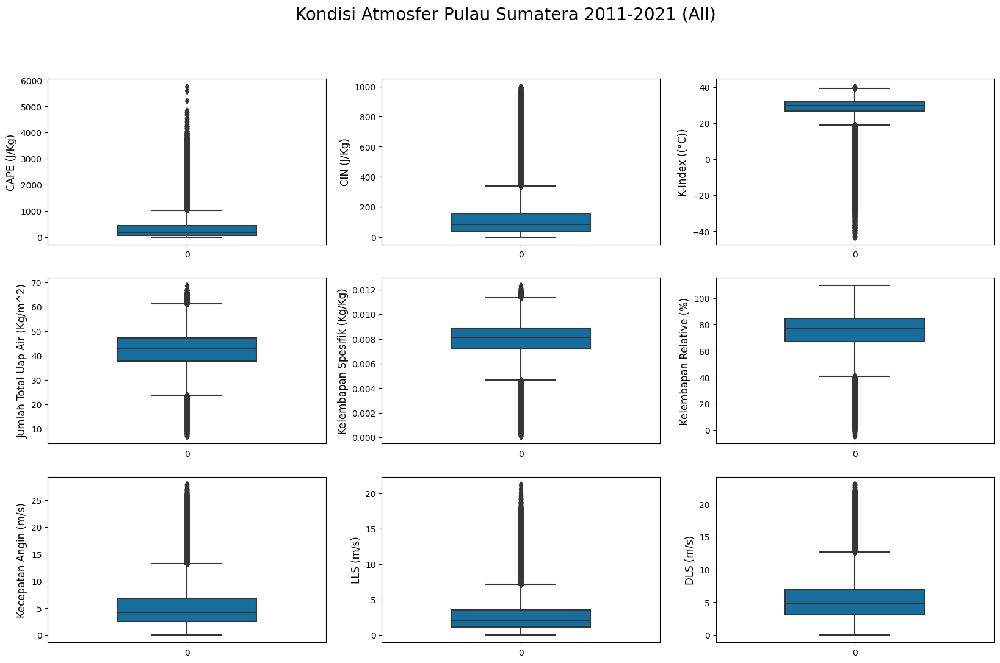

In [46]:
fig, axes = plt.subplots(3, 3, figsize=(20, 12))
 
fig.suptitle('Kondisi Atmosfer Pulau Sumatera 2011-2021 (All)', fontsize=20)
 
plt_cape        = sns.boxplot(ax=axes[0, 0], data=gabung_cape, width=0.5, palette="colorblind")
plt_cin         = sns.boxplot(ax=axes[0, 1], data=gabung_cin, width=0.5, palette="colorblind")
plt_kindex      = sns.boxplot(ax=axes[0, 2], data=gabung_kindex, width=0.5, palette="colorblind")
plt_tcwc        = sns.boxplot(ax=axes[1, 0], data=gabung_twv, width=0.5, palette="colorblind")
plt_specifichum = sns.boxplot(ax=axes[1, 1], data=gabung_specifichum, width=0.5, palette="colorblind")
plt_relativehum = sns.boxplot(ax=axes[1, 2], data=gabung_relativehum, width=0.5, palette="colorblind")
plt_windspeed   = sns.boxplot(ax=axes[2, 0], data=gabung_windspeed, width=0.5, palette="colorblind")
plt_LLS        = sns.boxplot(ax=axes[2, 1], data=gabung_LLS,width=0.5, palette="colorblind")
plt_DLS         = sns.boxplot(ax=axes[2, 2], data=gabung_DLS,width=0.5, palette="colorblind")

plt_cape.set_ylabel("CAPE (J/Kg)", fontsize=12)
plt_cin.set_ylabel("CIN (J/Kg)", fontsize=12)
plt_kindex.set_ylabel("K-Index ((°C))", fontsize=12)
plt_tcwc.set_ylabel("Jumlah Total Uap Air (Kg/m^2)", fontsize=12)
plt_specifichum.set_ylabel("Kelembapan Spesifik (Kg/Kg)", fontsize=12)
plt_relativehum.set_ylabel("Kelembapan Relative (%)", fontsize=12)
plt_windspeed.set_ylabel("Kecepatan Angin (m/s)", fontsize=12)
plt_LLS.set_ylabel("LLS (m/s)", fontsize=12)
plt_DLS.set_ylabel("DLS (m/s)", fontsize=12)

### Plot FF

In [53]:
data_bandang = pd.read_excel("D:\\[4] SEMESTER 8\\Bismillah TA\\DATA CH TAHUNAN\\Data\\Rasio_1d.xlsx")
data_bandang

,Longitude,Latitude,Centroid,time,PU GPM,CH GPM,Rasio,Kategori,PU GSMaP,CH GSMaP,Rasio.1,Kategori.1,PU Stasiun,CH Stasiun,Rasio.2,Kategori.2,Unnamed: 16,Unnamed: 17,Unnamed: 18
0,100.270712,-0.457451,centroid_3,2018-12-10,149.304346,74.772721,0.50,Hujan Lebat,114.171576,37.467233,0.33,Hujan Ringan,NaN,NaN,NaN,NaN,NaN,GPM,NaN
1,103.055541,-4.096977,centroid_5,2011-04-25,111.393090,71.027694,0.64,Hujan Lebat,111.268381,38.371408,0.34,Hujan Ringan,NaN,NaN,NaN,NaN,NaN,Hujan Ringan,0.0
2,102.655106,-3.920484,centroid_6,2020-10-05,124.911295,72.736826,0.58,Hujan Lebat,156.664596,22.433973,0.14,Hujan Ringan,NaN,NaN,NaN,NaN,NaN,Hujan Lebat,27.0
3,102.241437,-3.196779,centroid_10,2012-12-15,109.833700,100.413245,0.91,Hujan Lebat,100.594382,42.832929,0.43,Hujan Ringan,NaN,NaN,NaN,NaN,NaN,Hujan Ringan,22.0
4,104.627230,-5.445526,centroid_13,2014-11-05,109.579153,56.699493,0.52,Hujan Lebat,112.845564,12.001083,0.11,Hujan Ringan,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,103.488228,-4.491330,centroid_17,2016-04-11,108.427594,61.498214,0.57,Hujan Lebat,115.622387,57.953603,0.50,Hujan Lebat,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,103.702702,-4.350018,centroid_23,2011-04-24,85.424048,45.583515,0.53,Hujan Lebat,139.295629,21.141919,0.15,Hujan Ringan,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,103.218228,-4.093477,centroid_25,2014-04-05,83.965932,76.941837,0.92,Hujan Lebat,108.838410,39.455012,0.36,Hujan Ringan,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,101.975825,-2.556344,centroid_29,2014-11-27,85.620325,54.268506,0.63,Hujan Lebat,105.569564,13.181221,0.12,Hujan Ringan,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,101.602132,-1.962457,centroid_33,2021-04-15,82.186791,66.167518,0.81,Hujan Lebat,118.555249,48.091746,0.41,Hujan Ringan,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [54]:
cape_max = []
for i in range (len(data_bandang['time'])): 
    cape = np.max(cape_data.sel(longitude=data_bandang['Longitude'][i], latitude=data_bandang['Latitude'][i], method='nearest').sel(time=str(data_bandang.time[i])[0:27])).values
    cape_max.append(float(cape))

data_bandang['cape_max'] = cape_max

C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future 

In [55]:
cin_max = []
for i in range (len(data_bandang['time'])): 
    cin = np.max(cin_data.sel(longitude=data_bandang['Longitude'][i], latitude=data_bandang['Latitude'][i], method='nearest').sel(time=str(data_bandang.time[i])[0:27])).values
    cin_max.append(float(cin))

data_bandang['cin_max'] = cin_max

C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future 

In [56]:
kindex_max = []
for i in range (len(data_bandang['time'])): 
    kindex = np.max(kindex_data.sel(longitude=data_bandang['Longitude'][i], latitude=data_bandang['Latitude'][i], method='nearest').sel(time=str(data_bandang.time[i])[0:27])).values
    kindex_max.append(float(kindex))

data_bandang['kindex_max'] = kindex_max

C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future 

In [57]:
specifichum_max = []
for i in range (len(data_bandang['time'])): 
    specifichum = np.max(specifichum_data.sel(longitude=data_bandang['Longitude'][i], latitude=data_bandang['Latitude'][i], method='nearest').sel(time=str(data_bandang.time[i])[0:27])).values
    specifichum_max.append(float(specifichum))

data_bandang['specifichum_max'] = specifichum_max

C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future 

In [58]:
relativehum_max = []
for i in range (len(data_bandang['time'])): 
    relativehum = np.max(relativehum_data.sel(longitude=data_bandang['Longitude'][i], latitude=data_bandang['Latitude'][i], method='nearest').sel(time=str(data_bandang.time[i])[0:27])).values
    relativehum_max.append(float(relativehum))

data_bandang['relativehum_max'] = relativehum_max

C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future 

In [59]:
twv_max = []
for i in range (len(data_bandang['time'])): 
    twv = np.max(twv_data.sel(longitude=data_bandang['Longitude'][i], latitude=data_bandang['Latitude'][i], method='nearest').sel(time=str(data_bandang.time[i])[0:27])).values
    twv_max.append(float(twv))

data_bandang['twv_max'] = twv_max

C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future 

In [60]:
windspeed_max = []
for i in range (len(data_bandang['time'])): 
    windspeed = np.max(windspeed_data.sel(longitude=data_bandang['Longitude'][i], latitude=data_bandang['Latitude'][i], method='nearest').sel(time=str(data_bandang.time[i])[0:27])).values
    windspeed_max.append(float(windspeed))

data_bandang['windspeed_max'] = windspeed_max

C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future 

In [61]:
LLS_max = []
for i in range (len(data_bandang['time'])): 
    LLS = np.max(lls_data.sel(longitude=data_bandang['Longitude'][i], latitude=data_bandang['Latitude'][i], method='nearest').sel(time=str(data_bandang.time[i])[0:27])).values
    LLS_max.append(float(LLS))

data_bandang['LLS_max'] = LLS_max

C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future 

In [62]:
DLS_max = []
for i in range (len(data_bandang['time'])): 
    DLS = np.max(dls_data.sel(longitude=data_bandang['Longitude'][i], latitude=data_bandang['Latitude'][i], method='nearest').sel(time=str(data_bandang.time[i])[0:27])).values
    DLS_max.append(float(DLS))

data_bandang['DLS_max'] = DLS_max

C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
C:\Users\Nurul Nabila Fadiyah\anaconda3\lib\site-packages\xarray\core\indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future 

In [63]:
data_bandang

,Longitude,Latitude,Centroid,time,PU GPM,CH GPM,Rasio,Kategori,PU GSMaP,CH GSMaP,...,Unnamed: 18,cape_max,cin_max,kindex_max,specifichum_max,relativehum_max,twv_max,windspeed_max,LLS_max,DLS_max
0,100.270712,-0.457451,centroid_3,2018-12-10,149.304346,74.772721,0.50,Hujan Lebat,114.171576,37.467233,...,NaN,55.818359,NaN,32.161327,0.008316,76.276443,49.890881,1.074873,1.459708,5.963833
1,103.055541,-4.096977,centroid_5,2011-04-25,111.393090,71.027694,0.64,Hujan Lebat,111.268381,38.371408,...,0.0,30.357422,NaN,31.225895,0.008133,74.307114,44.762383,0.671791,2.005797,4.360487
2,102.655106,-3.920484,centroid_6,2020-10-05,124.911295,72.736826,0.58,Hujan Lebat,156.664596,22.433973,...,27.0,18.607422,NaN,19.896242,0.006286,57.759056,34.812790,0.384202,2.350010,6.305506
3,102.241437,-3.196779,centroid_10,2012-12-15,109.833700,100.413245,0.91,Hujan Lebat,100.594382,42.832929,...,22.0,99.882812,NaN,31.909225,0.008639,84.865402,42.484753,1.036995,1.334927,3.872193
4,104.627230,-5.445526,centroid_13,2014-11-05,109.579153,56.699493,0.52,Hujan Lebat,112.845564,12.001083,...,NaN,194.869141,19.852417,29.330158,0.007624,76.957420,38.553047,1.080813,4.002000,7.518955
5,103.488228,-4.491330,centroid_17,2016-04-11,108.427594,61.498214,0.57,Hujan Lebat,115.622387,57.953603,...,NaN,97.925781,16.251190,32.580944,0.009570,80.975830,50.051693,2.751794,3.073745,3.118483
6,103.702702,-4.350018,centroid_23,2011-04-24,85.424048,45.583515,0.53,Hujan Lebat,139.295629,21.141919,...,NaN,30.357422,NaN,25.570190,0.006808,61.791775,40.262913,1.727608,1.777759,3.715467
7,103.218228,-4.093477,centroid_25,2014-04-05,83.965932,76.941837,0.92,Hujan Lebat,108.838410,39.455012,...,NaN,5.876953,NaN,27.744568,0.008039,76.458443,40.696121,7.530099,2.406853,6.813581
8,101.975825,-2.556344,centroid_29,2014-11-27,85.620325,54.268506,0.63,Hujan Lebat,105.569564,13.181221,...,NaN,11.751953,NaN,31.433216,0.008583,79.853127,41.759453,6.541169,1.015504,6.735014
9,101.602132,-1.962457,centroid_33,2021-04-15,82.186791,66.167518,0.81,Hujan Lebat,118.555249,48.091746,...,NaN,0.980469,NaN,29.608795,0.008432,80.996277,36.904446,1.297317,1.929796,3.046873


In [96]:
# # data_bandang['cin_max']
# # # Menampilkan DataFrame hasil perhitungan
# dfcin_ff = pd.DataFrame(data_bandang['cin_max'])
# savedulu = dfcin_ff.to_excel('D:\[4] SEMESTER 8\Bismillah TA\DATA CH TAHUNAN\Data\jumlah_cin_ff.xlsx', index=None)

Text(0, 0.5, 'DLS (m/s)')

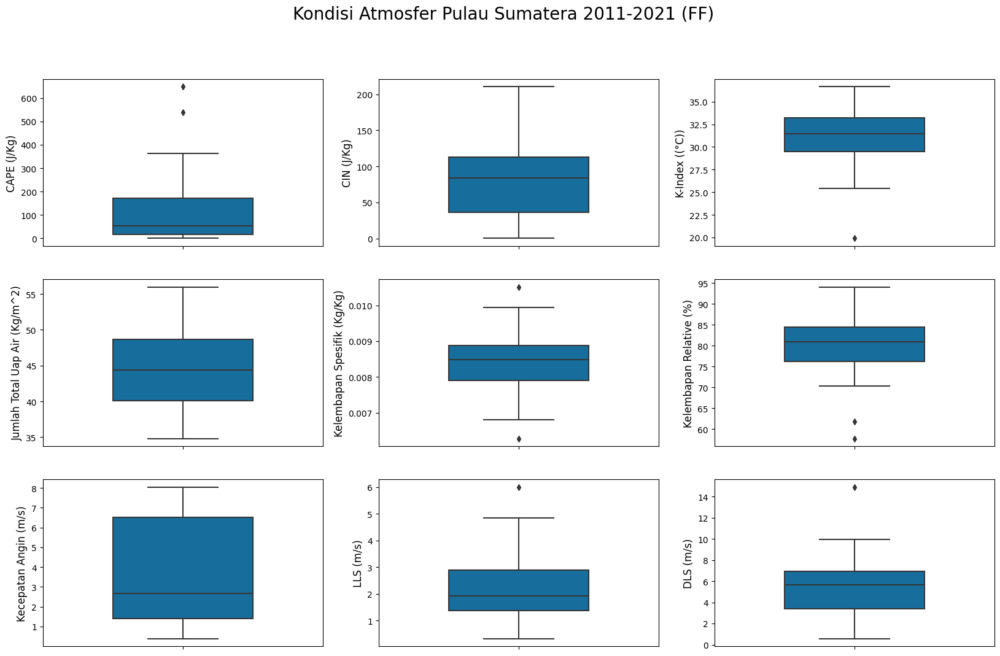

In [89]:
#######################
fig, axes = plt.subplots(3, 3, figsize=(20, 12))
 
fig.suptitle('Kondisi Atmosfer Pulau Sumatera 2011-2021 (FF)', fontsize=20)
 
plt_cape_max          = sns.boxplot(ax=axes[0, 0], data=data_bandang, y='cape_max', width=0.5, palette="colorblind")
plt_cin_max           = sns.boxplot(ax=axes[0, 1], data=data_bandang, y='cin_max', width=0.5, palette="colorblind")
plt_kindex_max        = sns.boxplot(ax=axes[0, 2], data=data_bandang, y='kindex_max', width=0.5, palette="colorblind")
plt_twv_max           = sns.boxplot(ax=axes[1, 0], data=data_bandang, y='twv_max',width=0.5, palette="colorblind")
plt_specifichum_max   = sns.boxplot(ax=axes[1, 1], data=data_bandang, y='specifichum_max',width=0.5, palette="colorblind")
plt_relativehum_max   = sns.boxplot(ax=axes[1, 2], data=data_bandang, y='relativehum_max',width=0.5, palette="colorblind")
plt_windspeed_max     = sns.boxplot(ax=axes[2, 0], data=data_bandang, y='windspeed_max',width=0.5, palette="colorblind")
plt_LLS_max          = sns.boxplot(ax=axes[2, 1], data=data_bandang, y='LLS_max',width=0.5, palette="colorblind")
plt_DLS_max           = sns.boxplot(ax=axes[2, 2], data=data_bandang, y='DLS_max',width=0.5, palette="colorblind")

plt_cape_max.set_ylabel("CAPE (J/Kg)", fontsize=12)
plt_cin_max.set_ylabel("CIN (J/Kg)", fontsize=12)
plt_kindex_max.set_ylabel("K-Index ((°C))", fontsize=12)
plt_twv_max.set_ylabel("Jumlah Total Uap Air (Kg/m^2)", fontsize=12)
plt_specifichum_max.set_ylabel("Kelembapan Spesifik (Kg/Kg)", fontsize=12)
plt_relativehum_max.set_ylabel("Kelembapan Relative (%)", fontsize=12)
plt_windspeed_max.set_ylabel("Kecepatan Angin (m/s)", fontsize=12)
plt_LLS_max.set_ylabel("LLS (m/s)", fontsize=12)
plt_DLS_max.set_ylabel("DLS (m/s)", fontsize=12)

### Gabung Semua Plot

In [64]:
cape_all = []
cin_all = []
kindex_all = []
twv_all =[]
specifichum_all = []
relativehum_all = []
windspeed_all = []
LLS_all = []
DLS_all = []
##################################
cape_all = pd.DataFrame(gabung_cape)
cin_all = pd.DataFrame(gabung_cin)
kindex_all = pd.DataFrame(gabung_kindex)
twv_all = pd.DataFrame(gabung_twv)
specifichum_all = pd.DataFrame(gabung_specifichum)
relativehum_all = pd.DataFrame(gabung_relativehum)
windspeed_all = pd.DataFrame(gabung_windspeed)
LLS_all = pd.DataFrame(gabung_LLS)
DLS_all = pd.DataFrame(gabung_DLS)
#################################
data_bandang['cape_all'] = cape_all
data_bandang['cin_all'] = cin_all
data_bandang['kindex_all'] = kindex_all
data_bandang['twv_all'] = twv_all
data_bandang['specifichum_all'] = specifichum_all
data_bandang['relative_all'] = relativehum_all
data_bandang['windspeed_all'] = windspeed_all
data_bandang['LLS_all'] = LLS_all
data_bandang['DLS_all'] = DLS_all

In [65]:
data_bandang

,Longitude,Latitude,Centroid,time,PU GPM,CH GPM,Rasio,Kategori,PU GSMaP,CH GSMaP,...,DLS_max,cape_all,cin_all,kindex_all,twv_all,specifichum_all,relative_all,windspeed_all,LLS_all,DLS_all
0,100.270712,-0.457451,centroid_3,2018-12-10,149.304346,74.772721,0.50,Hujan Lebat,114.171576,37.467233,...,5.963833,51.900391,NaN,20.327469,34.783253,0.004850,45.599541,10.963670,2.382901,8.717555
1,103.055541,-4.096977,centroid_5,2011-04-25,111.393090,71.027694,0.64,Hujan Lebat,111.268381,38.371408,...,4.360487,75.402344,262.430237,19.778484,34.428810,0.004730,44.127151,10.039498,1.780548,8.067392
2,102.655106,-3.920484,centroid_6,2020-10-05,124.911295,72.736826,0.58,Hujan Lebat,156.664596,22.433973,...,6.305506,53.859375,161.474396,19.214573,34.448502,0.004661,43.200768,9.587006,1.237046,7.337233
3,102.241437,-3.196779,centroid_10,2012-12-15,109.833700,100.413245,0.91,Hujan Lebat,100.594382,42.832929,...,3.872193,28.398438,NaN,19.055351,34.567741,0.004623,42.879707,9.615642,1.148391,6.870492
4,104.627230,-5.445526,centroid_13,2014-11-05,109.579153,56.699493,0.52,Hujan Lebat,112.845564,12.001083,...,7.518955,9.792969,NaN,18.925983,34.933125,0.004815,44.683388,9.489677,1.175338,6.165505
5,103.488228,-4.491330,centroid_17,2016-04-11,108.427594,61.498214,0.57,Hujan Lebat,115.622387,57.953603,...,3.118483,39.169922,NaN,19.415258,34.950630,0.005015,45.781548,9.179422,1.310185,5.819462
6,103.702702,-4.350018,centroid_23,2011-04-24,85.424048,45.583515,0.53,Hujan Lebat,139.295629,21.141919,...,3.715467,97.925781,NaN,19.300817,34.697922,0.005119,47.558643,8.734599,1.601146,5.697385
7,103.218228,-4.093477,centroid_25,2014-04-05,83.965932,76.941837,0.92,Hujan Lebat,108.838410,39.455012,...,6.813581,202.703125,551.549011,18.733589,34.855453,0.005178,47.644531,8.781218,1.754306,5.410524
8,101.975825,-2.556344,centroid_29,2014-11-27,85.620325,54.268506,0.63,Hujan Lebat,105.569564,13.181221,...,6.735014,356.443359,360.547791,19.634190,35.348831,0.005402,48.787682,8.834707,1.907481,5.272046
9,101.602132,-1.962457,centroid_33,2021-04-15,82.186791,66.167518,0.81,Hujan Lebat,118.555249,48.091746,...,3.046873,546.414062,264.764893,18.914373,35.444008,0.005071,45.407314,9.349239,1.493858,5.658588


[Text(1, 0, 'All'), Text(2, 0, 'P'), Text(3, 0, 'FF')]

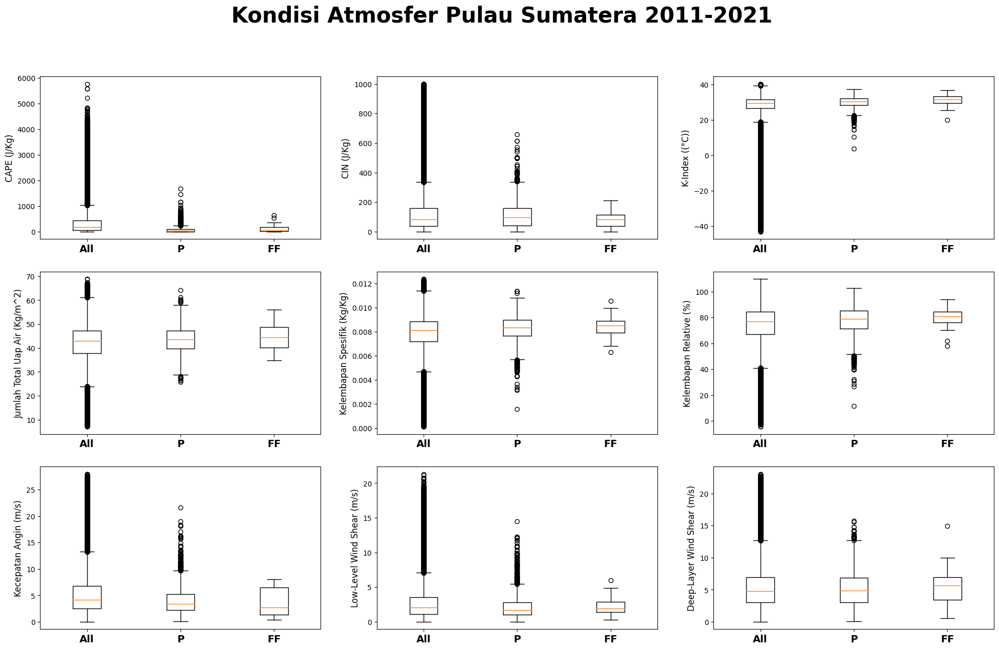

In [66]:
my_dict_cape              = {'CAPE ALL': gabung_cape, 'CAPE EXTREM':cape_semuacentroid, 'CAPE MAX': data_bandang['cape_max'].dropna().to_list()}
my_dict_cin               = {'CIN ALL': gabung_cin[~np.isnan(gabung_cin)], 'CIN EXTREM':cin_semuacentroid[~np.isnan(cin_semuacentroid)], 'CIN MAX': data_bandang['cin_max'].dropna().to_list()}
my_dict_kindex            = {'KINDEX ALL': gabung_kindex, 'KINDEX EXTREM':kindex_semuacentroid, 'KINDEX MAX': data_bandang['kindex_max'].dropna().to_list()}
my_dict_twv               = {'TWV ALL': gabung_twv, 'TWV EXTREM':twv_semuacentroid, 'TWV MAX': data_bandang['twv_max'].dropna().to_list()}
my_dict_specifichum       = {'SPECIFICHUM ALL': gabung_specifichum, 'SPECIFICHUM EXTREM':specifichum_semuacentroid, 'SPECIFICHUM MAX': data_bandang['specifichum_max'].dropna().to_list()}
my_dict_relativehum       = {'RELATIVE ALL': gabung_relativehum, 'RELATIVE EXTREM':relativehum_semuacentroid, 'RELATIVE MAX': data_bandang['relativehum_max'].dropna().to_list()}
my_dict_windspeed         = {'WINDSPEED ALL': gabung_windspeed, 'WINDHSEAR EXTREM':windspeed_semuacentroid, 'WINDSPEED MAX': data_bandang['windspeed_max'].dropna().to_list()}
my_dict_LLS              = {'LLS ALL': gabung_LLS, 'LLS EXTREM':lls_semuacentroid, 'LLS MAX': data_bandang['LLS_max'].dropna().to_list()}
my_dict_DLS               = {'DLS ALL': gabung_DLS, 'DLS EXTREM':dls_semuacentroid , 'DLS MAX': data_bandang['DLS_max'].dropna().to_list()}

fig, ax = plt.subplots(3, 3, figsize=(24, 14))
cape_total        = ax[0,0].boxplot(my_dict_cape.values())
cin_total         = ax[0,1].boxplot(my_dict_cin.values())
kindex_total      = ax[0,2].boxplot(my_dict_kindex.values())
twv_total         = ax[1,0].boxplot(my_dict_twv.values())
specifichum_total = ax[1,1].boxplot(my_dict_specifichum.values())
relativehum_total = ax[1,2].boxplot(my_dict_relativehum.values())
windspeed_total   = ax[2,0].boxplot(my_dict_windspeed.values())
LLS_total        = ax[2,1].boxplot(my_dict_LLS.values())
DLS_total         = ax[2,2].boxplot(my_dict_DLS.values())

fig.suptitle('Kondisi Atmosfer Pulau Sumatera 2011-2021', fontweight ="bold", fontsize=30)

ax[0,0].set_ylabel("CAPE (J/Kg)", fontsize=12)
ax[0,1].set_ylabel("CIN (J/Kg)", fontsize=12)
ax[0,2].set_ylabel("K-Index ((°C))", fontsize=12)
ax[1,0].set_ylabel("Jumlah Total Uap Air (Kg/m^2)", fontsize=12)
ax[1,1].set_ylabel("Kelembapan Spesifik (Kg/Kg)", fontsize=12)
ax[1,2].set_ylabel("Kelembapan Relative (%)", fontsize=12)
ax[2,0].set_ylabel("Kecepatan Angin (m/s)", fontsize=12)
ax[2,1].set_ylabel("Low-Level Wind Shear (m/s)", fontsize=12)
ax[2,2].set_ylabel("Deep-Layer Wind Shear (m/s)", fontsize=12)

ax[0,0].set_xticklabels(['All','P','FF'], fontsize=14, fontweight ="bold") 
ax[0,1].set_xticklabels(['All','P','FF'], fontsize=14, fontweight ="bold") 
ax[0,2].set_xticklabels(['All','P','FF'], fontsize=14, fontweight ="bold") 
ax[1,0].set_xticklabels(['All','P','FF'], fontsize=14, fontweight ="bold") 
ax[1,1].set_xticklabels(['All','P','FF'], fontsize=14, fontweight ="bold") 
ax[1,2].set_xticklabels(['All','P','FF'], fontsize=14, fontweight ="bold") 
ax[2,0].set_xticklabels(['All','P','FF'], fontsize=14, fontweight ="bold") 
ax[2,1].set_xticklabels(['All','P','FF'], fontsize=14, fontweight ="bold") 
ax[2,2].set_xticklabels(['All','P','FF'], fontsize=14, fontweight ="bold")
# fig.savefig('D:/[4] SEMESTER 8/Bismillah TA/DATA CH TAHUNAN/Hasil_Plot/boxplot_129centroid.png',bbox_inches='tight',dpi=60)

## Seaborn Boxplot

In [67]:
df_cape_all = pd.DataFrame(gabung_cape)
df_cape_all['Kategori'] = 'All'
df_cape_all.rename(columns={0:'Cape'},inplace=True)
df_cape_all

,Cape,Kategori
0,51.900391,All
1,75.402344,All
2,53.859375,All
3,28.398438,All
4,9.792969,All
...,...,...
8968171,102.820312,All
8968172,86.173828,All
8968173,71.486328,All
8968174,37.212891,All


In [68]:
df_cape_p = pd.DataFrame(cape_semuacentroid)
df_cape_p['Kategori']='P'
df_cape_p.rename(columns={0:'Cape'},inplace=True)
df_cape_p

,Cape,Kategori
0,16.648438,P
1,609.085938,P
2,157.658203,P
3,73.443359,P
4,219.349609,P
...,...,...
3372,9.792969,P
3373,5.876953,P
3374,18.607422,P
3375,11.751953,P


In [69]:
df_cape_ff = pd.DataFrame(data_bandang['cape_max'])
df_cape_ff['Kategori']='FF'
df_cape_ff.rename(columns={'cape_max':'Cape'},inplace=True)
df_cape_ff

,Cape,Kategori
0,55.818359,FF
1,30.357422,FF
2,18.607422,FF
3,99.882812,FF
4,194.869141,FF
5,97.925781,FF
6,30.357422,FF
7,5.876953,FF
8,11.751953,FF
9,0.980469,FF


In [70]:
concat_cape = pd.concat([df_cape_all,df_cape_p,df_cape_ff])
concat_cape

,Cape,Kategori
0,51.900391,All
1,75.402344,All
2,53.859375,All
3,28.398438,All
4,9.792969,All
...,...,...
22,82.257812,FF
23,39.169922,FF
24,6.855469,FF
25,46.025391,FF


In [118]:
cape_semuacentroid

array([ 16.6484375 , 609.0859375 , 157.65820312, ...,  18.60742188,
        11.75195312,  24.48242188])

In [119]:
len(cape_semuacentroid)

3412

In [120]:
cape_ff = data_bandang['cape_max'].values
cape_ff

array([5.58183594e+01, 1.94869141e+02, 9.79257812e+01, 3.03574219e+01,
       3.03574219e+01, 1.86074219e+01, 5.87695312e+00, 3.62324219e+01,
       9.98828125e+01, 1.17519531e+01, 9.80468750e-01, 1.56699219e+01,
       2.05640625e+02, 1.84097656e+02, 1.68429688e+02, 8.91113281e+01,
       6.48255859e+02, 2.25234375e+01, 5.38580078e+02, 1.95312500e-03,
       3.64277344e+02, 9.10703125e+01, 5.28808594e+01, 9.80468750e-01,
       1.76263672e+02, 8.22578125e+01, 3.91699219e+01, 6.85546875e+00,
       4.60253906e+01, 1.95312500e-03])

In [110]:
df_idw_cape = pd.DataFrame(cape_semuacentroid)
df_idw_cape.rename(columns={0:'Cape_p'},inplace=True)

df_idw_cape['Cape_ff'] = data_bandang['cape_max'].values
df_idw_cape

ValueError: Length of values (27) does not match length of index (3412)

In [109]:
idw_cape.apply(lambda x: len(np.intersect1d(x[df_cape_p['Cape']],x[df_cape_ff['Cape']], axis = 1)))

NameError: name 'idw_cape' is not defined

In [93]:
import pandas as pd
import numpy as np

idw_cape = pd.read_excel(r"D:\[4] SEMESTER 8\Bismillah TA\DATA CH TAHUNAN\Data\InterpIDW_CAPE.xlsx", sheet_name="Sheet2")

# # Ambil kolom nilai dari masing-masing dataframe
values1_cape = idw_cape['Cape_P'].unique()
values2_cape = idw_cape['Cape_FF'].unique()

# # Filter nilai 500-1000
filtered_values1_cape = values1_cape[np.logical_and(values1_cape >= 500, values1_cape <= 1000)]
filtered_values2_cape = values2_cape[np.logical_and(values2_cape >= 500, values2_cape <= 1000)]

# # Hitung jumlah nilai yang beririsan
num_intersecting_cape = len(set(filtered_values1_cape) & set(filtered_values2_cape))
num_intersecting_cape


1

In [111]:
# Initialize an empty DataFrame
idw_cape = pd.DataFrame()

# Add columns to the DataFrame
idw_cape['CAPE_P'] = df_cape_p
idw_cape['CAPE_FF'] = df_cape_ff
idw_cape

ValueError: Expected a 1D array, got an array with shape (3412, 2)

In [113]:
# save = df_cape_ff.to_excel('D:\[4] SEMESTER 8\Bismillah TA\DATA CH TAHUNAN\Data\cape_ff.xlsx', index=None)

CIN

In [71]:
cin_dropna = gabung_cin[~np.isnan(gabung_cin)]
df_cin_all = pd.DataFrame(cin_dropna)
df_cin_all['Kategori']='All'
df_cin_all.rename(columns={0:'Cin'},inplace=True)
df_cin_all

,Cin,Kategori
0,262.430237,All
1,161.474396,All
2,551.549011,All
3,360.547791,All
4,264.764893,All
...,...,...
4852951,51.134064,All
4852952,4.760925,All
4852953,10.895172,All
4852954,4.074249,All


In [72]:
cin_dropna_p = cin_semuacentroid[~np.isnan(cin_semuacentroid)]
df_cin_p = pd.DataFrame(cin_dropna_p)
df_cin_p['Kategori']='P'
df_cin_p.rename(columns={0:'Cin'},inplace=True)
df_cin_p

,Cin,Kategori
0,391.310638,P
1,100.299683,P
2,73.733154,P
3,131.367706,P
4,122.440979,P
...,...,...
908,183.829346,P
909,209.617615,P
910,214.561646,P
911,127.552856,P


In [73]:
cin_dropna_ff = data_bandang['cin_max'].dropna()
df_cin_ff = pd.DataFrame(cin_dropna_ff)
df_cin_ff['Kategori']='FF'
df_cin_ff.rename(columns={'cin_max':'Cin'},inplace=True)
df_cin_ff

,Cin,Kategori
4,19.852417,FF
5,16.251190,FF
10,210.350067,FF
11,0.137329,FF
12,75.259094,FF
14,102.344421,FF
15,57.253052,FF
17,92.502136,FF
18,41.780090,FF
21,114.338287,FF


In [74]:
concat_cin = pd.concat([df_cin_all,df_cin_p,df_cin_ff])
concat_cin

,Cin,Kategori
0,262.430237,All
1,161.474396,All
2,551.549011,All
3,360.547791,All
4,264.764893,All
...,...,...
17,92.502136,FF
18,41.780090,FF
21,114.338287,FF
23,112.369812,FF


In [75]:
# save = df_cin_ff.to_excel('D:\[4] SEMESTER 8\Bismillah TA\DATA CH TAHUNAN\Data\cin_ff.xlsx', index=None)

<Axes: xlabel='Kategori', ylabel='Cin'>

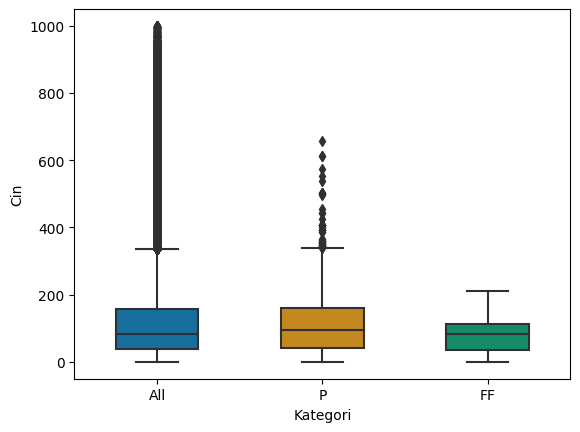

In [69]:
bplot_cin = sns.boxplot(y='Cin', x='Kategori', 
                 data=concat_cin, 
                 width=0.5,
                 palette="colorblind")
bplot_cin

K-index

In [76]:
df_kindex_all = pd.DataFrame(gabung_kindex)
df_kindex_all['Kategori']='All'
df_kindex_all.rename(columns={0:'Kindex'},inplace=True)
df_kindex_all

,Kindex,Kategori
0,20.327469,All
1,19.778484,All
2,19.214573,All
3,19.055351,All
4,18.925983,All
...,...,...
8968171,33.980770,All
8968172,33.612572,All
8968173,33.287491,All
8968174,33.428471,All


In [77]:
df_kindex_p = pd.DataFrame(kindex_semuacentroid)
df_kindex_p['Kategori']='P'
df_kindex_p.rename(columns={0:'Kindex'},inplace=True)
df_kindex_p

,Kindex,Kategori
0,28.714828,P
1,31.139652,P
2,31.736732,P
3,34.234531,P
4,20.407082,P
...,...,...
3372,31.710197,P
3373,27.523979,P
3374,29.855923,P
3375,28.449459,P


In [78]:
df_kindex_ff = pd.DataFrame(data_bandang['kindex_max'])
df_kindex_ff['Kategori']='FF'
df_kindex_ff.rename(columns={'kindex_max':'Kindex'},inplace=True)
df_kindex_ff

,Kindex,Kategori
0,32.161327,FF
1,31.225895,FF
2,19.896242,FF
3,31.909225,FF
4,29.330158,FF
5,32.580944,FF
6,25.570190,FF
7,27.744568,FF
8,31.433216,FF
9,29.608795,FF


In [73]:
# save = df_kindex_p.to_excel('D:\[4] SEMESTER 8\Bismillah TA\DATA CH TAHUNAN\Data\kindex_p.xlsx', index=None)

In [79]:
concat_kindex = pd.concat([df_kindex_all,df_kindex_p,df_kindex_ff])
concat_kindex

,Kindex,Kategori
0,20.327469,All
1,19.778484,All
2,19.214573,All
3,19.055351,All
4,18.925983,All
...,...,...
22,30.456322,FF
23,33.237736,FF
24,32.970707,FF
25,31.199360,FF


Relative Humidity

In [80]:
df_rh_all = pd.DataFrame(gabung_relativehum)
df_rh_all['Kategori']='All'
df_rh_all.rename(columns={0:'Relative Humidity'},inplace=True)
df_rh_all

,Relative Humidity,Kategori
0,45.599541,All
1,44.127151,All
2,43.200768,All
3,42.879707,All
4,44.683388,All
...,...,...
8968171,101.362335,All
8968172,99.386871,All
8968173,97.438004,All
8968174,96.673172,All


In [81]:
df_rh_p = pd.DataFrame(relativehum_semuacentroid)
df_rh_p['Kategori']='P'
df_rh_p.rename(columns={0:'Relative Humidity'},inplace=True)
df_rh_p

,Relative Humidity,Kategori
0,82.468674,P
1,83.973785,P
2,77.918564,P
3,100.454361,P
4,47.691566,P
...,...,...
3372,71.611816,P
3373,62.380733,P
3374,75.440041,P
3375,74.851082,P


In [82]:
rh_dropna_ff = data_bandang['relativehum_max'].dropna()
df_rh_ff = pd.DataFrame(rh_dropna_ff)
df_rh_ff['Kategori']='FF'
df_rh_ff.rename(columns={'relativehum_max':'Relative Humidity'},inplace=True)
df_rh_ff

,Relative Humidity,Kategori
0,76.276443,FF
1,74.307114,FF
2,57.759056,FF
3,84.865402,FF
4,76.957420,FF
5,80.975830,FF
6,61.791775,FF
7,76.458443,FF
8,79.853127,FF
9,80.996277,FF


In [83]:
# save = df_rh_ff.to_excel('D:\\[4] SEMESTER 8\\Bismillah TA\\DATA CH TAHUNAN\\Data\\rh_ff.xlsx', index=None)

In [84]:
concat_rh = pd.concat([df_rh_all,df_rh_p,df_rh_ff])
concat_rh

,Relative Humidity,Kategori
0,45.599541,All
1,44.127151,All
2,43.200768,All
3,42.879707,All
4,44.683388,All
...,...,...
22,78.446175,FF
23,84.096481,FF
24,93.988098,FF
25,76.045357,FF


Specific Humidity

In [85]:
df_sh_all = pd.DataFrame(gabung_specifichum)
df_sh_all['Kategori']='All'
df_sh_all.rename(columns={0:'Specific Humidity'},inplace=True)
df_sh_all

,Specific Humidity,Kategori
0,0.004850,All
1,0.004730,All
2,0.004661,All
3,0.004623,All
4,0.004815,All
...,...,...
8968171,0.010295,All
8968172,0.010149,All
8968173,0.010029,All
8968174,0.009670,All


In [86]:
df_sh_p = pd.DataFrame(specifichum_semuacentroid)
df_sh_p['Kategori']='P'
df_sh_p.rename(columns={0:'Specific Humidity'},inplace=True)
df_sh_p

,Specific Humidity,Kategori
0,0.008264,P
1,0.008505,P
2,0.008302,P
3,0.010510,P
4,0.005291,P
...,...,...
3372,0.008210,P
3373,0.007208,P
3374,0.008383,P
3375,0.007459,P


In [87]:
df_sh_ff = pd.DataFrame(data_bandang['specifichum_max'])
df_sh_ff['Kategori']='FF'
df_sh_ff.rename(columns={'specifichum_max':'Specific Humidity'},inplace=True)
df_sh_ff

,Specific Humidity,Kategori
0,0.008316,FF
1,0.008133,FF
2,0.006286,FF
3,0.008639,FF
4,0.007624,FF
5,0.009570,FF
6,0.006808,FF
7,0.008039,FF
8,0.008583,FF
9,0.008432,FF


In [88]:
# save = df_sh_p.to_excel('D:\\[4] SEMESTER 8\\Bismillah TA\\DATA CH TAHUNAN\\Data\\sh_p.xlsx', index=None)

In [89]:
concat_sh = pd.concat([df_sh_all,df_sh_p,df_sh_ff])
concat_sh

,Specific Humidity,Kategori
0,0.004850,All
1,0.004730,All
2,0.004661,All
3,0.004623,All
4,0.004815,All
...,...,...
22,0.008625,FF
23,0.008875,FF
24,0.009937,FF
25,0.007756,FF


Total Column Water Vapour

In [90]:
df_tcwv_all = pd.DataFrame(gabung_twv)
df_tcwv_all['Kategori']='All'
df_tcwv_all.rename(columns={0:'Total Column Water Vapour'},inplace=True)
df_tcwv_all

,Total Column Water Vapour,Kategori
0,34.783253,All
1,34.428810,All
2,34.448502,All
3,34.567741,All
4,34.933125,All
...,...,...
8968171,53.406876,All
8968172,52.612659,All
8968173,51.823914,All
8968174,49.558315,All


In [91]:
df_tcwv_p = pd.DataFrame(twv_semuacentroid)
df_tcwv_p['Kategori']='P'
df_tcwv_p.rename(columns={0:'Total Column Water Vapour'},inplace=True)
df_tcwv_p

,Total Column Water Vapour,Kategori
0,41.929016,P
1,43.762501,P
2,45.868378,P
3,50.409416,P
4,33.866512,P
...,...,...
3372,48.275097,P
3373,44.637669,P
3374,47.376953,P
3375,44.296352,P


In [92]:
df_tcwv_ff = pd.DataFrame(data_bandang['twv_max'])
df_tcwv_ff['Kategori']='FF'
df_tcwv_ff.rename(columns={'twv_max':'Total Column Water Vapour'},inplace=True)
df_tcwv_ff

,Total Column Water Vapour,Kategori
0,49.890881,FF
1,44.762383,FF
2,34.812790,FF
3,42.484753,FF
4,38.553047,FF
5,50.051693,FF
6,40.262913,FF
7,40.696121,FF
8,41.759453,FF
9,36.904446,FF


In [93]:
# save = df_tcwv_ff.to_excel('D:\\[4] SEMESTER 8\\Bismillah TA\\DATA CH TAHUNAN\\Data\\tcwv_ff.xlsx', index=None)

In [94]:
concat_tcwv = pd.concat([df_tcwv_all,df_tcwv_p,df_tcwv_ff])
concat_tcwv

,Total Column Water Vapour,Kategori
0,34.783253,All
1,34.428810,All
2,34.448502,All
3,34.567741,All
4,34.933125,All
...,...,...
22,48.344017,FF
23,49.041965,FF
24,48.958824,FF
25,44.017391,FF


Wind Speed

In [95]:
df_ws_all = pd.DataFrame(gabung_windspeed)
df_ws_all['Kategori']='All'
df_ws_all.rename(columns={0:'Windspeed'},inplace=True)
df_ws_all

,Windspeed,Kategori
0,10.963670,All
1,10.039498,All
2,9.587006,All
3,9.615642,All
4,9.489677,All
...,...,...
8968171,2.763391,All
8968172,3.630297,All
8968173,4.374115,All
8968174,7.089616,All


In [96]:
df_ws_p = pd.DataFrame(windspeed_semuacentroid)
df_ws_p['Kategori']='P'
df_ws_p.rename(columns={0:'Windspeed'},inplace=True)
df_ws_p

,Windspeed,Kategori
0,1.913484,P
1,2.044529,P
2,2.450357,P
3,1.777521,P
4,1.119974,P
...,...,...
3372,1.283402,P
3373,1.936914,P
3374,3.661918,P
3375,3.938688,P


In [97]:
df_ws_ff = pd.DataFrame(data_bandang['windspeed_max'])
df_ws_ff['Kategori']='FF'
df_ws_ff.rename(columns={'windspeed_max':'Windspeed'},inplace=True)
df_ws_ff

,Windspeed,Kategori
0,1.074873,FF
1,0.671791,FF
2,0.384202,FF
3,1.036995,FF
4,1.080813,FF
5,2.751794,FF
6,1.727608,FF
7,7.530099,FF
8,6.541169,FF
9,1.297317,FF


In [98]:
# save = df_ws_ff.to_excel('D:\\[4] SEMESTER 8\\Bismillah TA\\DATA CH TAHUNAN\\Data\\ws_ff.xlsx', index=None)

In [99]:
concat_ws = pd.concat([df_ws_all,df_ws_p,df_ws_ff])
concat_ws

,Windspeed,Kategori
0,10.963670,All
1,10.039498,All
2,9.587006,All
3,9.615642,All
4,9.489677,All
...,...,...
22,7.909054,FF
23,3.523558,FF
24,8.048834,FF
25,7.797725,FF


LLS

In [100]:
df_lls_all = pd.DataFrame(gabung_LLS)
df_lls_all['Kategori']='All'
df_lls_all.rename(columns={0:'LLS'},inplace=True)
df_lls_all

,LLS,Kategori
0,2.382901,All
1,1.780548,All
2,1.237046,All
3,1.148391,All
4,1.175338,All
...,...,...
8968171,4.738345,All
8968172,4.884814,All
8968173,5.099519,All
8968174,2.796241,All


In [101]:
df_lls_p = pd.DataFrame(lls_semuacentroid)
df_lls_p['Kategori']='P'
df_lls_p.rename(columns={0:'LLS'},inplace=True)
df_lls_p

,LLS,Kategori
0,5.042342,P
1,1.504004,P
2,1.985597,P
3,2.811817,P
4,0.958433,P
...,...,...
3372,2.463349,P
3373,3.182497,P
3374,1.999043,P
3375,1.821072,P


In [102]:
df_lls_ff = pd.DataFrame(data_bandang['LLS_max'])
df_lls_ff['Kategori']='FF'
df_lls_ff.rename(columns={'LLS_max':'LLS'},inplace=True)
df_lls_ff

,LLS,Kategori
0,1.459708,FF
1,2.005797,FF
2,2.350010,FF
3,1.334927,FF
4,4.002000,FF
5,3.073745,FF
6,1.777759,FF
7,2.406853,FF
8,1.015504,FF
9,1.929796,FF


In [103]:
# save = df_lls_ff.to_excel('D:\\[4] SEMESTER 8\\Bismillah TA\\DATA CH TAHUNAN\\Data\\lls_ff.xlsx', index=None)

In [104]:
concat_lls = pd.concat([df_lls_all,df_lls_p,df_lls_ff])
concat_lls

,LLS,Kategori
0,2.382901,All
1,1.780548,All
2,1.237046,All
3,1.148391,All
4,1.175338,All
...,...,...
22,3.394720,FF
23,2.385413,FF
24,0.995052,FF
25,3.918952,FF


DLS

In [105]:
df_dls_all = pd.DataFrame(gabung_DLS)
df_dls_all['Kategori']='All'
df_dls_all.rename(columns={0:'DLS'},inplace=True)
df_dls_all

,DLS,Kategori
0,8.717555,All
1,8.067392,All
2,7.337233,All
3,6.870492,All
4,6.165505,All
...,...,...
8968171,5.271521,All
8968172,4.955422,All
8968173,4.565859,All
8968174,6.358125,All


In [106]:
df_dls_p = pd.DataFrame(dls_semuacentroid)
df_dls_p['Kategori']='P'
df_dls_p.rename(columns={0:'DLS'},inplace=True)
df_dls_p

,DLS,Kategori
0,3.228294,P
1,2.230188,P
2,6.019411,P
3,5.476885,P
4,6.750037,P
...,...,...
3372,1.629171,P
3373,6.180750,P
3374,8.524274,P
3375,7.112907,P


In [107]:
df_dls_ff = pd.DataFrame(data_bandang['DLS_max'])
df_dls_ff['Kategori']='FF'
df_dls_ff.rename(columns={'DLS_max':'DLS'},inplace=True)
df_dls_ff

,DLS,Kategori
0,5.963833,FF
1,4.360487,FF
2,6.305506,FF
3,3.872193,FF
4,7.518955,FF
5,3.118483,FF
6,3.715467,FF
7,6.813581,FF
8,6.735014,FF
9,3.046873,FF


In [108]:
# save = df_dls_ff.to_excel('D:\\[4] SEMESTER 8\\Bismillah TA\\DATA CH TAHUNAN\\Data\\dls_ff.xlsx', index=None)

In [109]:
concat_dls = pd.concat([df_dls_all,df_dls_p,df_dls_ff])
concat_dls

,DLS,Kategori
0,8.717555,All
1,8.067392,All
2,7.337233,All
3,6.870492,All
4,6.165505,All
...,...,...
22,6.927495,FF
23,2.190584,FF
24,4.604455,FF
25,6.901704,FF


C:\Users\Nurul Nabila Fadiyah\AppData\Local\Temp\ipykernel_24172\2405565647.py:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  bx_cape.set_yticklabels(bx_cape.get_yticklabels(), fontsize=16)


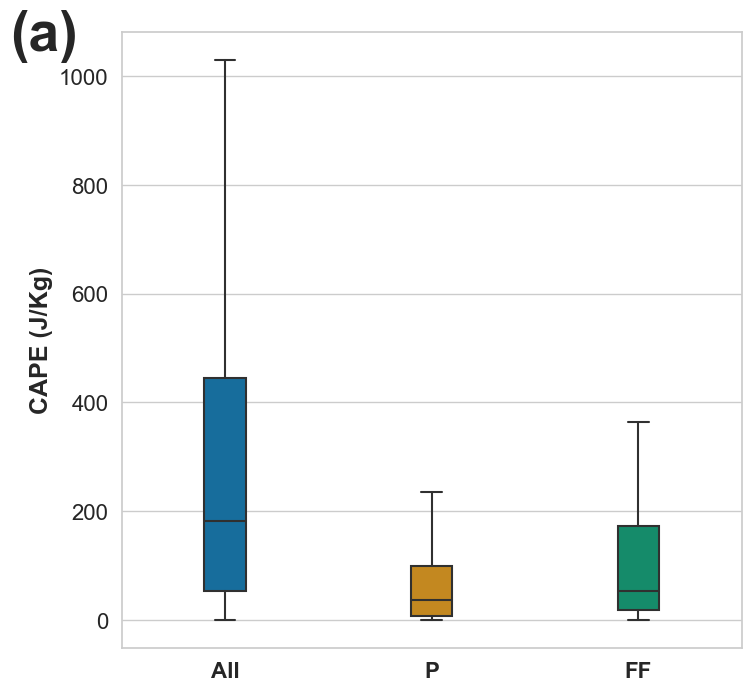

In [136]:
# use to set style of background of plot
import seaborn
seaborn.set(style="whitegrid")

fig = plt.figure(figsize=(8, 8))
bx_cape = seaborn.boxplot(
    data=concat_cape,
    x='Kategori',
    y='Cape', width=0.2, palette="colorblind",
    flierprops = {'marker': 'o', 'markerfacecolor': 'gray', 'markersize': 7, 'markeredgecolor': 'gray', 'markeredgewidth': 0.5}, showfliers=False)

bx_cape.set_ylabel("CAPE (J/Kg)", fontsize=18, fontweight='bold')
bx_cape.set_xticklabels(['All', 'P', 'FF'], fontsize=16, fontweight='bold')
bx_cape.set_xlabel('')
bx_cape.set_yticklabels(bx_cape.get_yticklabels(), fontsize=16)
plt.annotate('(a)', xy=(-0.18, 0.97), xycoords='axes fraction', fontsize=40, fontweight='bold')

plt.show()

C:\Users\Nurul Nabila Fadiyah\AppData\Local\Temp\ipykernel_24172\866766929.py:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  bx_cin.set_yticklabels(bx_cin.get_yticklabels(), fontsize=16)


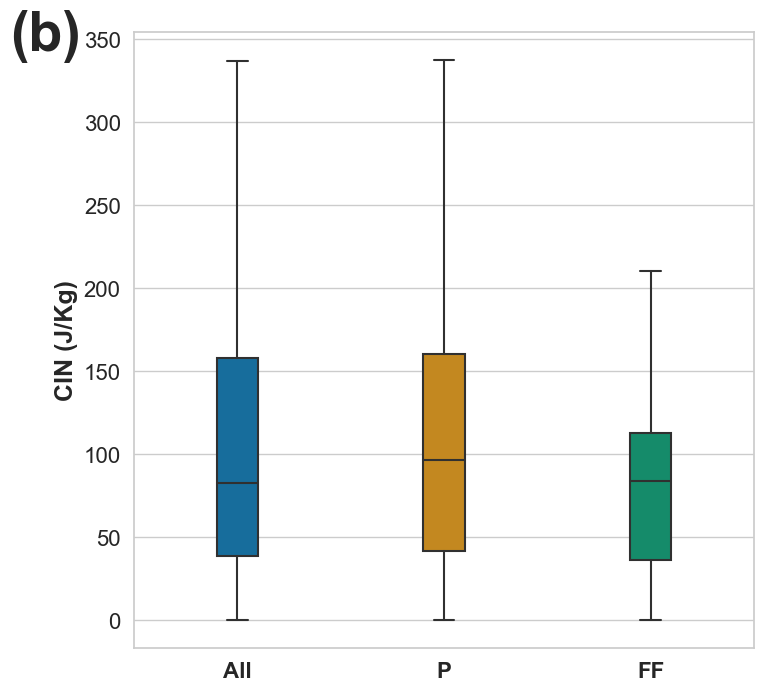

In [137]:
# use to set style of background of plot
import seaborn
seaborn.set(style="whitegrid")

fig = plt.figure(figsize=(8, 8))
bx_cin = seaborn.boxplot(
    data=concat_cin,
    x='Kategori',
    y='Cin', width=0.2, palette="colorblind", 
    flierprops = {'marker': 'o', 'markerfacecolor': 'gray', 'markersize': 7, 'markeredgecolor': 'gray', 'markeredgewidth': 0.5}, showfliers=False)

bx_cin.set_ylabel("CIN (J/Kg)", fontsize=18, fontweight='bold')
bx_cin.set_xticklabels(['All', 'P', 'FF'], fontsize=16, fontweight='bold')
bx_cin.set_xlabel('')
bx_cin.set_yticklabels(bx_cin.get_yticklabels(), fontsize=16)
plt.annotate('(b)', xy=(-0.20, 0.97), xycoords='axes fraction', fontsize=40, fontweight='bold')

plt.show()

C:\Users\Nurul Nabila Fadiyah\AppData\Local\Temp\ipykernel_24172\4009976623.py:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  bx_kindex.set_yticklabels(bx_kindex.get_yticklabels(), fontsize=16)


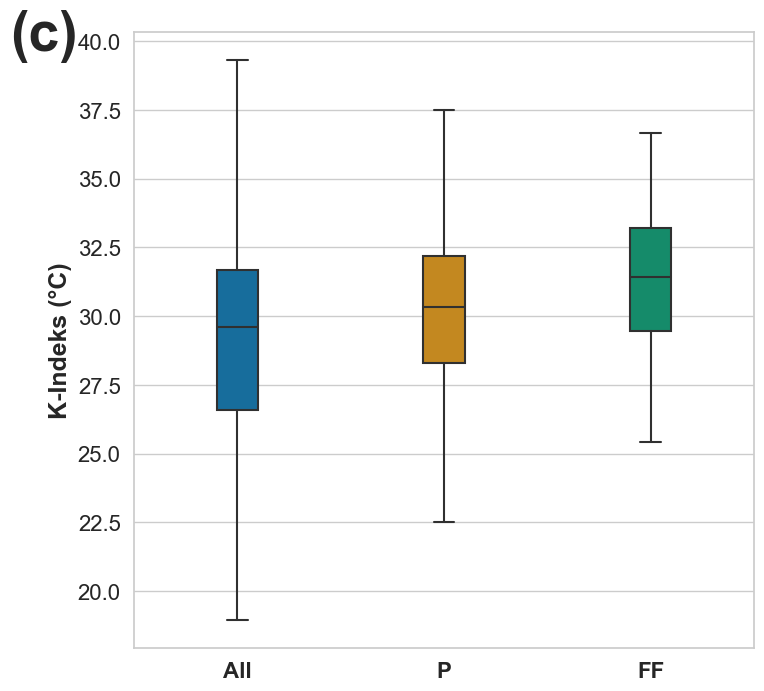

In [139]:
# use to set style of background of plot
import seaborn
seaborn.set(style="whitegrid")

fig = plt.figure(figsize=(8, 8))
bx_kindex = seaborn.boxplot(
    data=concat_kindex,
    x='Kategori',
    y='Kindex', width=0.2, palette="colorblind",
    flierprops = {'marker': 'o', 'markerfacecolor': 'gray', 'markersize': 7, 'markeredgecolor': 'gray', 'markeredgewidth': 0.5}, showfliers=False)

bx_kindex.set_ylabel("K-Indeks (°C)", fontsize=18, fontweight='bold')
bx_kindex.set_xticklabels(['All', 'P', 'FF'], fontsize=16, fontweight='bold')
bx_kindex.set_xlabel('')
bx_kindex.set_yticklabels(bx_kindex.get_yticklabels(), fontsize=16)
plt.annotate('(c)', xy=(-0.20, 0.97), xycoords='axes fraction', fontsize=40, fontweight='bold')

plt.show()

C:\Users\Nurul Nabila Fadiyah\AppData\Local\Temp\ipykernel_24172\2618678367.py:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  bx_twv.set_yticklabels(bx_twv.get_yticklabels(), fontsize=16)


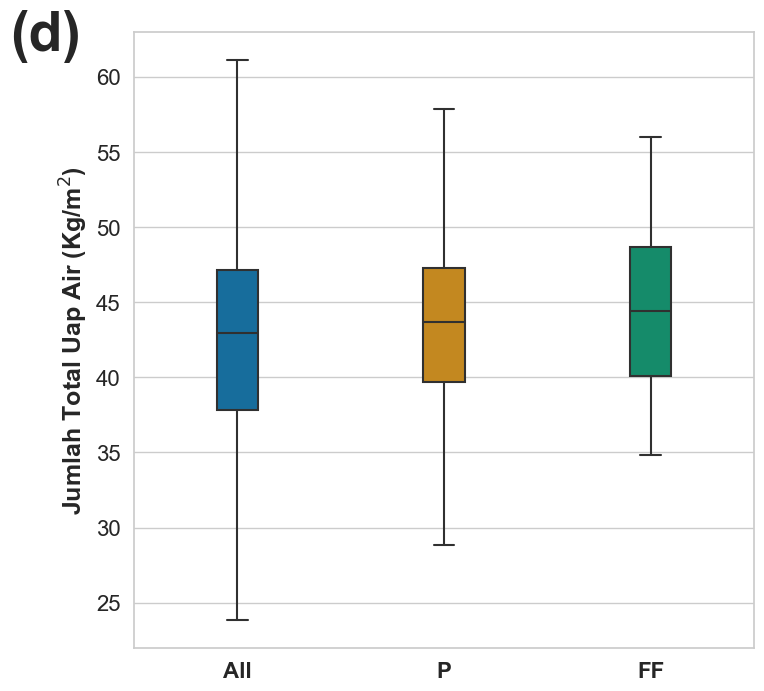

In [141]:
# use to set style of background of plot
import seaborn
seaborn.set(style="whitegrid")

fig = plt.figure(figsize=(8, 8))
bx_twv = seaborn.boxplot(
    data=concat_tcwv,
    x='Kategori',
    y='Total Column Water Vapour', width=0.2, palette="colorblind", 
    flierprops = {'marker': 'o', 'markerfacecolor': 'gray', 'markersize': 7, 'markeredgecolor': 'gray', 'markeredgewidth': 0.5}, showfliers=False)

bx_twv.set_ylabel("Jumlah Total Uap Air (Kg/m$^2$)", fontsize=18, fontweight='bold')
bx_twv.set_xticklabels(['All', 'P', 'FF'], fontsize=16, fontweight='bold')
bx_twv.set_xlabel('')
bx_twv.set_yticklabels(bx_twv.get_yticklabels(), fontsize=16)
plt.annotate('(d)', xy=(-0.20, 0.97), xycoords='axes fraction', fontsize=40, fontweight='bold')

plt.show()

C:\Users\Nurul Nabila Fadiyah\AppData\Local\Temp\ipykernel_24172\1731494279.py:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  bx_specifichum.set_yticklabels(bx_specifichum.get_yticklabels(), fontsize=16)


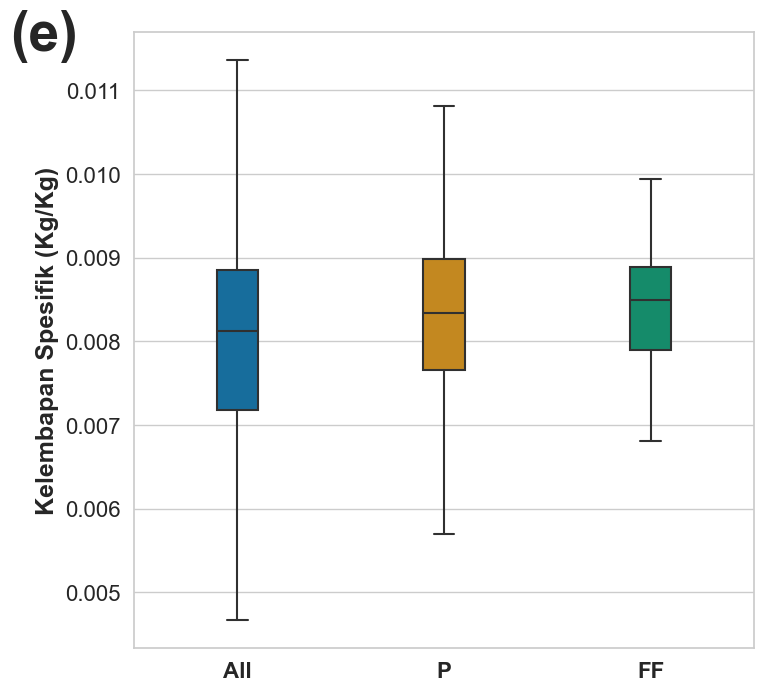

In [142]:
# use to set style of background of plot
import seaborn
seaborn.set(style="whitegrid")

fig = plt.figure(figsize=(8, 8))
bx_specifichum = seaborn.boxplot(
    data=concat_sh,
    x='Kategori',
    y='Specific Humidity', width=0.2, palette="colorblind",
    flierprops = {'marker': 'o', 'markerfacecolor': 'gray', 'markersize': 7, 'markeredgecolor': 'gray', 'markeredgewidth': 0.5}, showfliers=False)

bx_specifichum.set_ylabel("Kelembapan Spesifik (Kg/Kg)", fontsize=18, fontweight='bold')
bx_specifichum.set_xticklabels(['All', 'P', 'FF'], fontsize=16, fontweight='bold')
bx_specifichum.set_xlabel('')
bx_specifichum.set_yticklabels(bx_specifichum.get_yticklabels(), fontsize=16)
plt.annotate('(e)', xy=(-0.20, 0.97), xycoords='axes fraction', fontsize=40, fontweight='bold')

plt.show()

C:\Users\Nurul Nabila Fadiyah\AppData\Local\Temp\ipykernel_24172\1501222780.py:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  bx_relativehum.set_yticklabels(bx_relativehum.get_yticklabels(), fontsize=16)


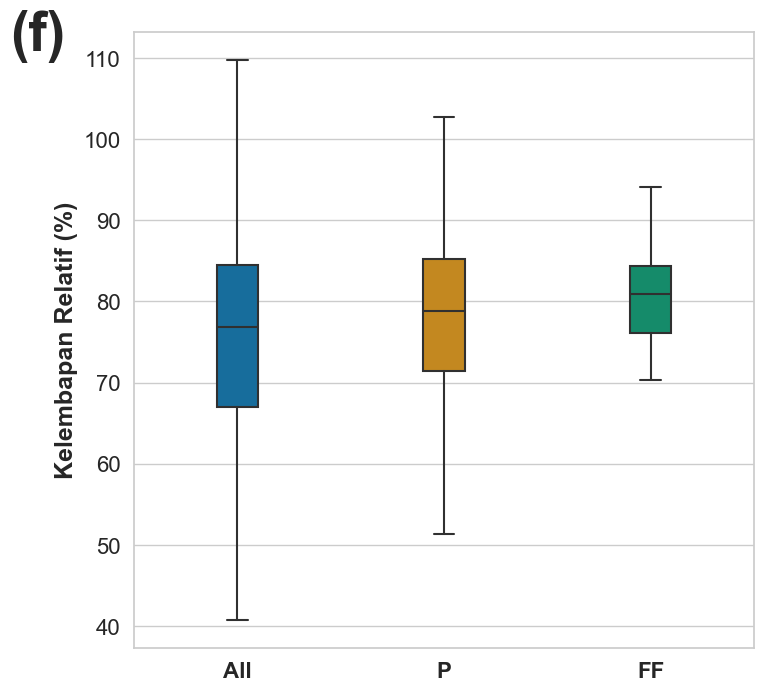

In [144]:
# use to set style of background of plot
import seaborn
seaborn.set(style="whitegrid")

fig = plt.figure(figsize=(8, 8))
bx_relativehum = seaborn.boxplot(
    data=concat_rh,
    x='Kategori',
    y='Relative Humidity', width=0.2, palette="colorblind", 
    flierprops = {'marker': 'o', 'markerfacecolor': 'gray', 'markersize': 7, 'markeredgecolor': 'gray', 'markeredgewidth': 0.5}, showfliers=False)

bx_relativehum.set_ylabel("Kelembapan Relatif (%)", fontsize=18,fontweight='bold')
bx_relativehum.set_xticklabels(['All', 'P', 'FF'], fontsize=16,fontweight='bold')
bx_relativehum.set_xlabel('')
bx_relativehum.set_yticklabels(bx_relativehum.get_yticklabels(), fontsize=16)
plt.annotate('(f)', xy=(-0.20, 0.97), xycoords='axes fraction', fontsize=40,fontweight='bold')

# Move the legend to the bottom-right corner
# legend = plt.legend(title="Kategori", loc="lower right")
# for handle in legend.legendHandles:
#     handle.set_markersize(8)  # Adjust the marker size as desired

plt.show()

C:\Users\Nurul Nabila Fadiyah\AppData\Local\Temp\ipykernel_24172\656363235.py:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  bx_windspeed.set_yticklabels(bx_windspeed.get_yticklabels(), fontsize=16)


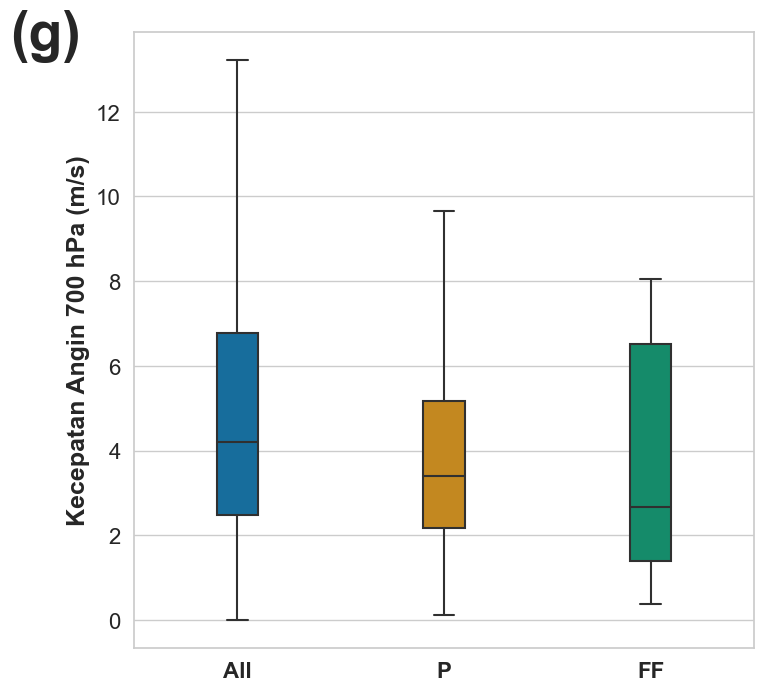

In [145]:
# use to set style of background of plot
import seaborn
seaborn.set(style="whitegrid")

fig = plt.figure(figsize=(8, 8))
bx_windspeed = seaborn.boxplot(
    data=concat_ws,
    x='Kategori',
    y='Windspeed', width=0.2, palette="colorblind", 
    flierprops = {'marker': 'o', 'markerfacecolor': 'gray', 'markersize': 7, 'markeredgecolor': 'gray', 'markeredgewidth': 0.5}, showfliers=False)

bx_windspeed.set_ylabel("Kecepatan Angin 700 hPa (m/s)", fontsize=18, fontweight='bold')
bx_windspeed.set_xticklabels(['All', 'P', 'FF'], fontsize=16, fontweight='bold')
bx_windspeed.set_xlabel('')
bx_windspeed.set_yticklabels(bx_windspeed.get_yticklabels(), fontsize=16)
plt.annotate('(g)', xy=(-0.20, 0.97), xycoords='axes fraction', fontsize=40, fontweight='bold')

plt.show()

C:\Users\Nurul Nabila Fadiyah\AppData\Local\Temp\ipykernel_24172\1266963970.py:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  bx_LLS.set_yticklabels(bx_LLS.get_yticklabels(), fontsize=16)


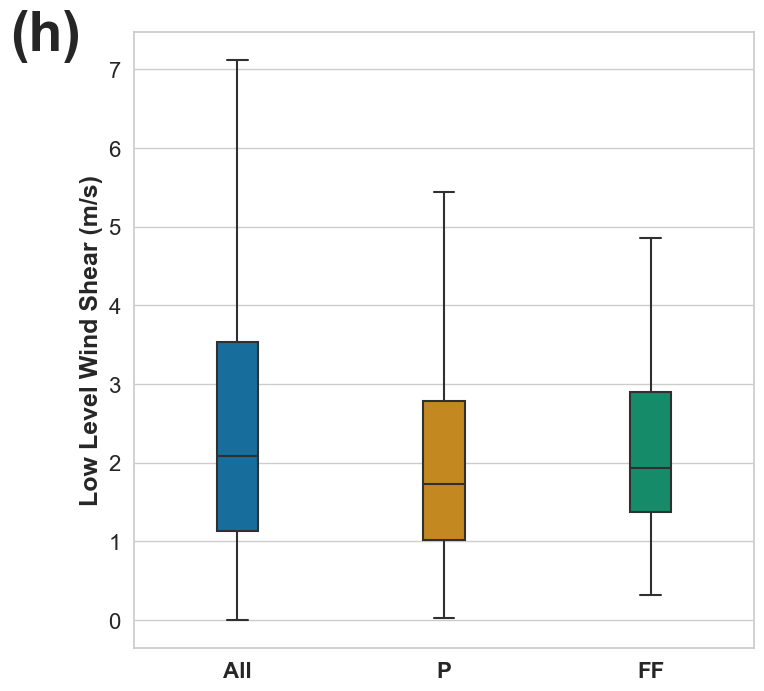

In [146]:
# use to set style of background of plot
import seaborn
seaborn.set(style="whitegrid")

fig = plt.figure(figsize=(8, 8))
bx_LLS = seaborn.boxplot(
    data=concat_lls,
    x='Kategori',
    y='LLS', width=0.2, palette="colorblind", 
    flierprops = {'marker': 'o', 'markerfacecolor': 'gray', 'markersize': 7, 'markeredgecolor': 'gray', 'markeredgewidth': 0.5}, showfliers=False)

bx_LLS.set_ylabel("Low Level Wind Shear (m/s)", fontsize=18, fontweight='bold')
bx_LLS.set_xticklabels(['All', 'P', 'FF'], fontsize=16, fontweight='bold')
bx_LLS.set_xlabel('')
bx_LLS.set_yticklabels(bx_LLS.get_yticklabels(), fontsize=16)
plt.annotate('(h)', xy=(-0.20, 0.97), xycoords='axes fraction', fontsize=40, fontweight='bold')

plt.show()

C:\Users\Nurul Nabila Fadiyah\AppData\Local\Temp\ipykernel_24172\3743771548.py:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  bx_DLS.set_yticklabels(bx_DLS.get_yticklabels(), fontsize=16)


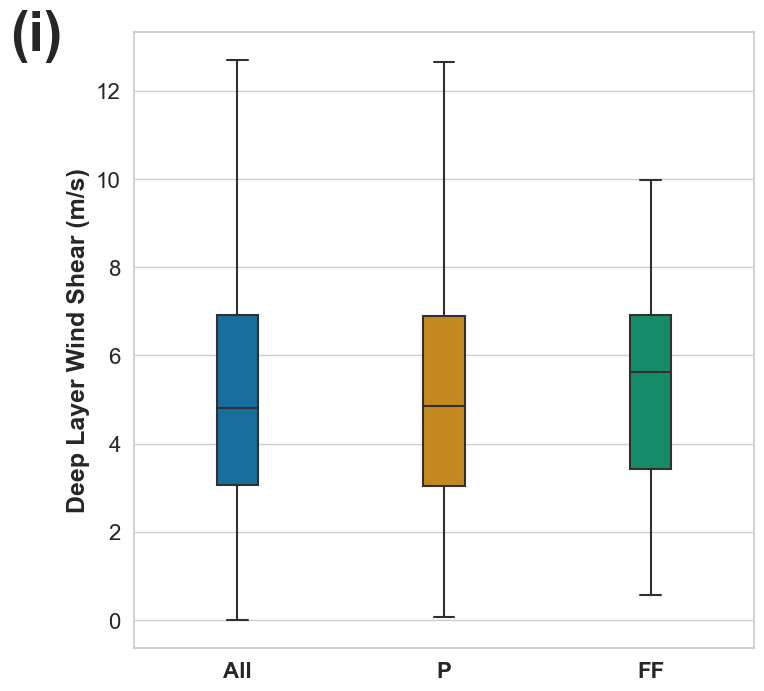

In [147]:
# use to set style of background of plot
import seaborn
seaborn.set(style="whitegrid")

fig = plt.figure(figsize=(8, 8))
bx_DLS = seaborn.boxplot(
    data=concat_dls,
    x='Kategori',
    y='DLS', width=0.2, palette="colorblind", 
    flierprops = {'marker': 'o', 'markerfacecolor': 'gray', 'markersize': 7, 'markeredgecolor': 'gray', 'markeredgewidth': 0.5}, showfliers=False)

bx_DLS.set_ylabel("Deep Layer Wind Shear (m/s)", fontsize=18, fontweight='bold')
bx_DLS.set_xticklabels(['All', 'P', 'FF'], fontsize=16, fontweight='bold')
bx_DLS.set_xlabel('')
bx_DLS.set_yticklabels(bx_DLS.get_yticklabels(), fontsize=16)
plt.annotate('(i)', xy=(-0.20, 0.97), xycoords='axes fraction', fontsize=40, fontweight='bold')

plt.show()

In [ ]:
#######################
fig, axes = plt.subplots(3, 3, figsize=(24, 16))
 
# fig.suptitle('Kondisi Atmosfer Pulau Sumatera 2011-2021',fontweight ="bold", fontsize=30, y=0.98)

# use to set style of background of plot
import seaborn
seaborn.set(style="whitegrid")

bx_cape         = seaborn.boxplot(ax=axes[0, 0], data=concat_cape, x='Kategori', y='Cape', width=0.2, palette="colorblind", hue="Kategori", dodge=False, order=['All','P','FF'], flierprops={'marker': 'D', 'markerfacecolor': 'gray', 'markersize': 5})
bx_cin           = seaborn.boxplot(ax=axes[0, 1], data=concat_cin, x='Kategori', y='Cin', width=0.2, palette="colorblind", hue="Kategori", dodge=False, order=['All','P','FF'], flierprops={'marker': 'D', 'markerfacecolor': 'gray', 'markersize': 5})
bx_kindex        = seaborn.boxplot(ax=axes[0, 2], data=concat_kindex, x='Kategori', y='Kindex', width=0.2, palette="colorblind", hue="Kategori", dodge=False, order=['All','P','FF'], flierprops={'marker': 'D', 'markerfacecolor': 'gray', 'markersize': 5})
bx_twv           = seaborn.boxplot(ax=axes[1, 0], data=concat_tcwv, x='Kategori', y='Total Column Water Vapour',width=0.2, palette="colorblind", hue="Kategori", dodge=False, order=['All','P','FF'], flierprops={'marker': 'D', 'markerfacecolor': 'gray', 'markersize': 3})
bx_specifichum   = seaborn.boxplot(ax=axes[1, 1], data=concat_sh, x='Kategori', y='Specific Humidity',width=0.2, palette="colorblind", hue="Kategori", dodge=False, order=['All','P','FF'], flierprops={'marker': 'D', 'markerfacecolor': 'gray', 'markersize': 5})
bx_relativehum   = seaborn.boxplot(ax=axes[1, 2], data=concat_rh, x='Kategori', y='Relative Humidity',width=0.2, palette="colorblind", hue="Kategori", dodge=False, order=['All','P','FF'], flierprops={'marker': 'D', 'markerfacecolor': 'gray', 'markersize': 5})
bx_windspeed     = seaborn.boxplot(ax=axes[2, 0], data=concat_ws, x='Kategori', y='Windspeed',width=0.2, palette="colorblind", hue="Kategori", dodge=False, order=['All','P','FF'], flierprops={'marker': 'D', 'markerfacecolor': 'gray', 'markersize': 5})
bx_LLS          = seaborn.boxplot(ax=axes[2, 1], data=concat_lls, x='Kategori', y='LLS',width=0.2, palette="colorblind", hue="Kategori", dodge=False, order=['All','P','FF'], flierprops={'marker': 'D', 'markerfacecolor': 'gray', 'markersize': 5})
bx_DLS           = seaborn.boxplot(ax=axes[2, 2], data=concat_dls, x='Kategori', y='DLS',width=0.2, palette="colorblind", hue="Kategori", dodge=False, order=['All','P','FF'], flierprops={'marker': 'D', 'markerfacecolor': 'gray', 'markersize': 5})

bx_cape.set_ylabel("CAPE (J/Kg)", fontsize=16)
bx_cin.set_ylabel("CIN (J/Kg)", fontsize=16)
bx_kindex.set_ylabel("K-Index (°C)", fontsize=16)
bx_twv.set_ylabel("Jumlah Total Uap Air (Kg/m$^2$)", fontsize=16)
bx_specifichum.set_ylabel("Kelembapan Spesifik (Kg/Kg)", fontsize=16)
bx_relativehum.set_ylabel("Kelembapan Relatif (%)", fontsize=16)
bx_windspeed.set_ylabel("Kecepatan Angin (m/s)", fontsize=16)
bx_LLS.set_ylabel("LLS (m/s)", fontsize=16)
bx_DLS.set_ylabel("DLS (m/s)", fontsize=16)

subplots_to_modify = [(0, 0), (0, 1), (0, 2), (1, 0), (1, 1), (1, 2), (2, 0), (2, 1), (2, 2)]
for subplot in subplots_to_modify:
    axes[subplot].set_xticklabels([])
    axes[subplot].set_xlabel('')
    axes[subplot].set_yticklabels(axes[subplot].get_yticklabels(), fontsize=14)

### Ambang Batas

In [118]:
# Initialize an empty DataFrame
percen_all = pd.DataFrame()

# Calculate percentiles
percentiles_all_cape = df_cape_all.quantile([0, 0.25, 0.5, 0.75, 1])
percentiles_all_cin = df_cin_all.quantile([0, 0.25, 0.5, 0.75, 1])
percentiles_all_kindex = df_kindex_all.quantile([0, 0.25, 0.5, 0.75, 1])
percentiles_all_tcwv = df_tcwv_all.quantile([0, 0.25, 0.5, 0.75, 1])
percentiles_all_sh = df_sh_all.quantile([0, 0.25, 0.5, 0.75, 1])
percentiles_all_rh = df_rh_all.quantile([0, 0.25, 0.5, 0.75, 1])
percentiles_all_ws = df_ws_all.quantile([0, 0.25, 0.5, 0.75, 1])
percentiles_all_lls = df_lls_all.quantile([0, 0.25, 0.5, 0.75, 1])
percentiles_all_dls = df_dls_all.quantile([0, 0.25, 0.5, 0.75, 1])

CAPE = []
CIN = []
Kindex = []
TCWV =[]
Specific_Humidity = []
Relative_Humidity = []
Windspeed = []
LLS = []
DLS = []
#################################
percen_all['CAPE'] = percentiles_all_cape
percen_all['CIN'] = percentiles_all_cin
percen_all['Kindex'] = percentiles_all_kindex
percen_all['TCWV'] = percentiles_all_tcwv
percen_all['Specific_Humidity'] = percentiles_all_sh
percen_all['Relative_Humidity'] = percentiles_all_rh
percen_all['Windspeed'] = percentiles_all_ws
percen_all['LLS'] = percentiles_all_lls
percen_all['DLS'] = percentiles_all_dls
percen_all.T

,0.00,0.25,0.50,0.75,1.00
CAPE,0.001953,53.859375,182.138672,444.574219,5763.777344
CIN,0.000000,38.224670,82.430969,157.674805,999.563354
Kindex,-43.180618,26.593525,29.608795,31.685318,40.356293
TCWV,7.087395,37.835411,42.944214,47.151596,68.804398
Specific_Humidity,0.000107,0.007182,0.008129,0.008855,0.012355
Relative_Humidity,-4.545662,66.977867,76.855171,84.448219,109.777466
Windspeed,0.000985,2.479240,4.189227,6.778987,27.937849
LLS,0.000370,1.135275,2.077281,3.529792,21.309372
DLS,0.003313,3.054766,4.805176,6.913794,23.039139


In [119]:
# Initialize an empty DataFrame
percen_p = pd.DataFrame()

# Calculate percentiles
percentiles_p_cape = df_cape_p.quantile([0, 0.25, 0.5, 0.75, 1])
percentiles_p_cin = df_cin_p.quantile([0, 0.25, 0.5, 0.75, 1])
percentiles_p_kindex = df_kindex_p.quantile([0, 0.25, 0.5, 0.75, 1])
percentiles_p_tcwv = df_tcwv_p.quantile([0, 0.25, 0.5, 0.75, 1])
percentiles_p_sh = df_sh_p.quantile([0, 0.25, 0.5, 0.75, 1])
percentiles_p_rh = df_rh_p.quantile([0, 0.25, 0.5, 0.75, 1])
percentiles_p_ws = df_ws_p.quantile([0, 0.25, 0.5, 0.75, 1])
percentiles_p_lls = df_lls_p.quantile([0, 0.25, 0.5, 0.75, 1])
percentiles_p_dls = df_dls_p.quantile([0, 0.25, 0.5, 0.75, 1])

CAPE = []
CIN = []
Kindex = []
TCWV =[]
Specific_Humidity = []
Relative_Humidity = []
Windspeed = []
LLS = []
DLS = []
#################################
percen_p['CAPE'] = percentiles_p_cape
percen_p['CIN'] = percentiles_p_cin
percen_p['Kindex'] = percentiles_p_kindex
percen_p['TCWV'] = percentiles_p_tcwv
percen_p['Specific_Humidity'] = percentiles_p_sh
percen_p['Relative_Humidity'] = percentiles_p_rh
percen_p['Windspeed'] = percentiles_p_ws
percen_p['LLS'] = percentiles_p_lls
percen_p['DLS'] = percentiles_p_dls
percen_p.T

,0.00,0.25,0.50,0.75,1.00
CAPE,0.001953,7.835938,37.212891,99.882812,1670.576172
CIN,0.000000,41.749573,96.210175,160.101044,658.272888
Kindex,3.672167,28.301846,30.325294,32.187862,37.505219
TCWV,25.787596,39.669983,43.650917,47.271931,64.110207
Specific_Humidity,0.001585,0.007661,0.008339,0.008980,0.011352
Relative_Humidity,11.572952,71.487076,78.814270,85.182373,102.771332
Windspeed,0.120367,2.173957,3.403960,5.176117,21.586998
LLS,0.022860,1.018689,1.723707,2.785887,14.454382
DLS,0.074408,3.037988,4.843366,6.890413,15.728266


In [120]:
# Initialize an empty DataFrame
percen_ff = pd.DataFrame()

# Calculate percentiles
percentiles_ff_cape = df_cape_ff.quantile([0, 0.25, 0.5, 0.75, 1])
percentiles_ff_cin = df_cin_ff.quantile([0, 0.25, 0.5, 0.75, 1])
percentiles_ff_kindex = df_kindex_ff.quantile([0, 0.25, 0.5, 0.75, 1])
percentiles_ff_tcwv = df_tcwv_ff.quantile([0, 0.25, 0.5, 0.75, 1])
percentiles_ff_sh = df_sh_ff.quantile([0, 0.25, 0.5, 0.75, 1])
percentiles_ff_rh = df_rh_ff.quantile([0, 0.25, 0.5, 0.75, 1])
percentiles_ff_ws = df_ws_ff.quantile([0, 0.25, 0.5, 0.75, 1])
percentiles_ff_lls = df_lls_ff.quantile([0, 0.25, 0.5, 0.75, 1])
percentiles_ff_dls = df_dls_ff.quantile([0, 0.25, 0.5, 0.75, 1])

CAPE = []
CIN = []
Kindex = []
TCWV =[]
Specific_Humidity = []
Relative_Humidity = []
Windspeed = []
LLS = []
DLS = []
#################################
percen_ff['CAPE'] = percentiles_ff_cape
percen_ff['CIN'] = percentiles_ff_cin
percen_ff['Kindex'] = percentiles_ff_kindex
percen_ff['TCWV'] = percentiles_ff_tcwv
percen_ff['Specific_Humidity'] = percentiles_ff_sh
percen_ff['Relative_Humidity'] = percentiles_ff_rh
percen_ff['Windspeed'] = percentiles_ff_ws
percen_ff['LLS'] = percentiles_ff_lls
percen_ff['DLS'] = percentiles_ff_dls
percen_ff.T

,0.00,0.25,0.50,0.75,1.00
CAPE,0.001953,17.138672,52.880859,172.346680,648.255859
CIN,0.137329,36.298172,83.880615,112.861931,210.350067
Kindex,19.896242,29.469477,31.433216,33.204563,36.649403
TCWV,34.812790,40.082409,44.417782,48.667282,55.988628
Specific_Humidity,0.006286,0.007898,0.008493,0.008886,0.010516
Relative_Humidity,57.759056,76.160900,80.975830,84.385849,94.063766
Windspeed,0.384202,1.390291,2.666427,6.527489,8.048834
LLS,0.319690,1.366774,1.929796,2.896265,6.007997
DLS,0.567233,3.416975,5.633803,6.914599,14.910164
